# Chapter 16 - Generalized Linear Madness

- Applying statistical models to a scientific theory

## Geometric people

In [[Chapter 4]], we created a model relating height and weight. However, this was not satisfying - we would like a model based on biology which relates the two, not just a random statistical correlation.

Let's say that people are cylinders.

### The scientific method

$$
V = \pi r^2 h
$$

We don't know each person's radius, but let's assume that it is some constant proportion, $\rho$, of the height. Then

$$
V = \pi r^2 h = \pi (\rho h)^2 h = \pi \rho^2 h^3
$$

Also, weight is some proportion $k$ of the volume, so

$$
W = kV = k \pi \rho^2 h^3
$$

### The statistical model

We can use this formula in a statistical model.

$$
\begin{align*}
W_i &\sim \text{Log-Normal}(\mu_i, \sigma) & \text{[Disstribution for weight]} \\
e^{\mu_i} &= k \pi \rho^2 h_i^3 & \text{[Expected median weight]} \\ 
k &\sim \text{some prior} & \text{[ prior relationship between volume and weight ]} \\
\rho &\sim \text{some prior} & \text{[prior proportion of radius to height]} \\
\sigma &\sim \text{Exponential}(1) \\
\end{align*}
$$

Weight is positive and continuous, so we use the log-normal distribution. The mean $\mu_i$ is the mean *of the logarithm*. The median of the logarithm is $e^{\mu_i}$.

Now we just need priors for $k$, $\rho$, and $\sigma$.

First, note that since we're multiplying $k$ and $\rho$, we can't distinguish between them - the parameters are not **identifiable**. We could replace $k \rho^2$ with a new constant $\theta = k \rho^2$, but we don't have a good way of assigning priors to that quantity.

One of the advantages of a scientific basis to a statistical model is that our parameters have a physical meaning, which can help us when assigning priors.

The parameter $\rho$ is the ration of the radius to the height. If we think about humans, $\rho$ is definitely less than 1 (people aren't wider than they are tall). It's more than zero, and probably less that 0.1. Knowing that, we can assign a prior of

$$
\rho \sim \text{Beta}(2, 18)
$$

This has a mean of 2 / (2 + 18) = 0.1, which seems reasonable for most people.

The parameter $k$ relates mass to volume - it's the density of a person!

Let's first divide out the weight and height by their means.

In [3]:
library(rethinking)
library(ggplot2)
library(cmdstanr)

options(repr.plot.width = 14, repr.plot.height = 7)

Loading required package: cmdstanr



This is cmdstanr version 0.9.0

- CmdStanR documentation and vignettes: mc-stan.org/cmdstanr

- CmdStan path: /Users/ericr/.cmdstan/cmdstan-2.36.0

- CmdStan version: 2.36.0

Loading required package: posterior

This is posterior version 1.6.1


Attaching package: ‘posterior’


The following objects are masked from ‘package:stats’:

    mad, sd, var


The following objects are masked from ‘package:base’:

    %in%, match


Loading required package: parallel

rethinking (Version 2.42)


Attaching package: ‘rethinking’


The following object is masked from ‘package:stats’:

    rstudent




In [2]:
data(Howell1)
d <- Howell1

d$w <- d$weight / mean(d$weight)
d$h <- d$height / mean(d$height)

If the mean is 1, then plugging into our formula we have

$$
1 = k\pi \rho^2 1^3
$$

If $\rho < 0.5$, than $k$ must be greater than 1. Let's say that it's 2 (and also that it must be positive).

$$
k \sim \text{Exponential}(0.5)
$$

With some prior predictive simulation we could certainly do better than this, but this should be good enough for now.

In [18]:
m16.1 <- ulam(
    alist(
        w ~ dlnorm(mu, sigma),
        exp(mu) <- 3.141593 * k * p^2 * h^3,
        p ~ beta(2, 18),
        k ~ exponential(0.5),
        sigma ~ exponential(1)
    ),
    data = d,
    chains = 4,
    cores = 4
)

Running MCMC with 4 parallel chains, with 1 thread(s) per chain...

Chain 1 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmpo48CkT/model-17b3355149885.stan', line 23, column 4 to column 32)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 



Chain 2 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter[1] is -inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmpo48CkT/model-17b3355149885.stan', line 23, column 4 to column 32)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 



Chain 3 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmpo48CkT/model-17b3355149885.stan', line 23, column 4 to column 32)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmpo48CkT/model-17b3355149885.stan', line 23, column 4 to column 32)

Chain 3 If this warning occurs sporadically, such as for highly constrai

Chain 4 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter[1] is -inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmpo48CkT/model-17b3355149885.stan', line 23, column 4 to column 32)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter[1] is -inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmpo48CkT/model-17b3355149885.stan', line 23, column 4 to column 32)

Chain 4 If this warning occurs sporadically, such as for highly constr

Chain 1 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 4 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 2 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 3 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 3 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 1 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 2 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 4 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 2 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 3 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 1 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 4 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 2 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 1 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 3 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 4 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 2 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 2 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 3 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 3 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 1 Iteration: 500 / 1000 [ 50%]

In [19]:
precis(m16.1)

,mean,sd,5.5%,94.5%,rhat,ess_bulk
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
p,0.2492925,0.059986470,0.1695633,0.3571229,1.003490,476.6588
k,5.7175274,2.753438283,2.3706409,10.5307770,1.003922,476.0783
sigma,0.2068310,0.006402844,0.1971160,0.2175113,1.003367,658.7651


So for `p`, the prior mean was updated from about $0.1 \to 0.2$ and `k` went from $2 \to 5.7$.

Remember the $k$ and $\rho$ were not identifiable. The easiest way to see this is by looking at the `pairs` plot:

Warning message in par(usr):
“argument 1 does not name a graphical parameter”
Warning message in par(usr):
“argument 1 does not name a graphical parameter”
Warning message in par(usr):
“argument 1 does not name a graphical parameter”


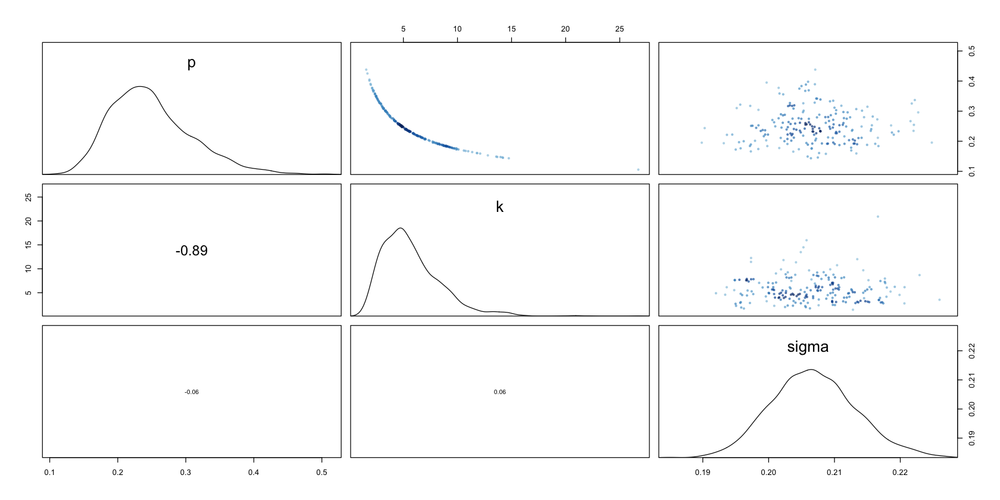

In [20]:
par(bg = 'white')
pairs(m16.1)

For `p` and `k`, note that there's a well-defined ridge of values where they multiply together (rather than a scatter of points). There's also a strong negative correlation - if one of these gets larger, then other needs to get smaller to accommodate that.

Note that in principle we could separate $\rho$ and $k$ in a different model. For instance, the density $k$ could vary with age or sex as fat has a different density than muscle, and allometric growth patterns means that $\rho$ is probably different as you age.

Let's see how our estimate compares to the data.

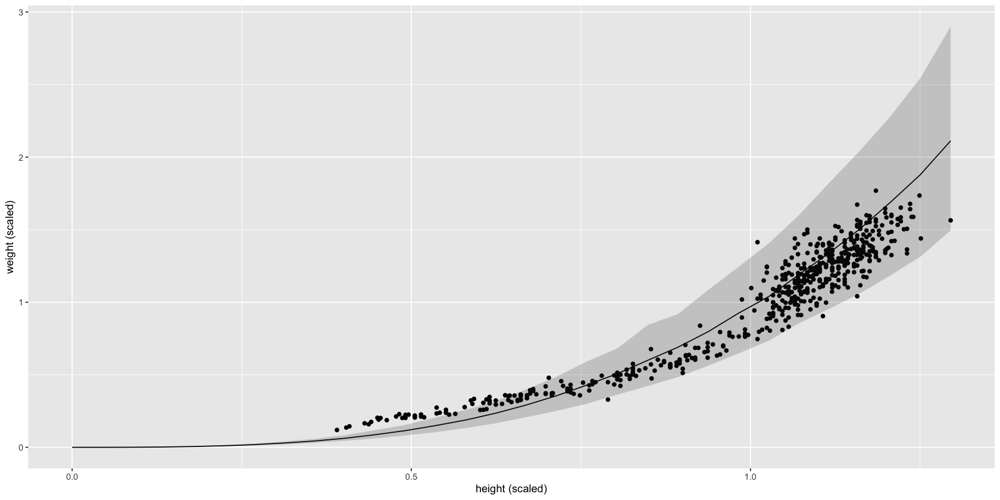

In [21]:
h_seq <- seq(from = 0, to = max(d$h), length.out = 30)
w_sim <- sim(m16.1, data = list(h = h_seq))
mu_mean <- apply(w_sim, 2, mean)
w_CI <- apply(w_sim, 2, PI)

# w_CI
sim_df <- data.frame(
    h = h_seq,
    mean = mu_mean,
    lower = w_CI[1, ],
    upper = w_CI[2, ]
)

ggplot() +
    geom_point(data = d, mapping = aes(h, w)) +
    geom_line(data = sim_df, mapping = aes(h, mean)) +
    geom_ribbon(data = sim_df, mapping = aes(h, ymin = lower, ymax = upper), alpha = 0.2) +
    labs(x = 'height (scaled)', y = 'weight (scaled)')

We can see that this is generally doing a good job. There is a discrepancy at low heights (possible because both $k$ and $\rho$ are not fixed but vary with age and other factors). Because the parameters have physical meaning, the places where they don't match the data tell us something interesting about the underlying theory!

### GLM in disguise

Before moving on to the next example, let's consider what happes to the model when we relate the logarithm of weight to height. In that case, we expect

$$
\begin{align*}
\log w_i &= \mu_i = \log(k\rho^2 \pi h^3) \\
    &= \log k + \log \pi + 2\log \rho + 3 \log k
\end{align*}
$$

On a log scale, this is a linear regression with intercept $\log k + \log \pi + 2\log \rho$.

Lots of natural relationships are GML relationships on the appropriate scale.

## Hidden minds and observed behaviour

The **inverse problem** is one of the most basic problems in science. Basically: how can you figure out causes from observations.

We'll consider a specific problem from developmental psychology. Children may have manuy difference cognitive strategies. From their behaviour, how can we figure out which one they are using?

Experiment: 629 children age 4 - 14 saw four other children choose among three differently coloured boxes. Each child then made their choice. in each tral, three demonstrators chose the same colour, and the fourth chose a different colour. Thus, for each trial one colour was the majority, one was a minority, and one was not chosen at all. How can we figure out from this whether children are influenced by the majority?

In [7]:
data(Boxes)
precis(Boxes)

,mean,sd,5.5%,94.5%,histogram
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
y,2.1208267,0.7279860,1,3,▃▁▁▁▇▁▁▁▁▅
gender,1.5055644,0.5003669,1,2,▇▁▁▁▁▁▁▁▁▇
age,8.0302067,2.4979055,5,13,▇▃▅▃▃▃▂▂▂▁
majority_first,0.4848967,0.5001696,0,1,▇▁▁▁▁▁▁▁▁▇
culture,3.7519873,1.9603189,1,8,▃▂▁▇▁▂▁▂▁▂▁▁▁▁


The outcome `y` is the box the fifth child chose, where 1 is the unchosen colour, 2 is the majority colour, and 3 is the minority colour. The other variable we'll consider is `majority_first`, which indicates whether the majority colour was chosen before the other colour.

We're interested in using the outcome `y` to infer the strategies the children used to choose a colour.

In [8]:
table(Boxes$y) / length(Boxes$y)


        1         2         3 
0.2114467 0.4562798 0.3322734 

So 45% chose the majority colour.

Does this mean that 45% of the children used the strategy 'follow the majority'? No! There are three choices and many strategies, and many different strategies could result in choosing the majority colour. For example, if they chose randomly we would get the majority colour 33% of the time, which is not far off of what we have.

A GLM of the choices would infer frequencies of behaviour. By we want *strategy*. What can we do?

### The scientific model

The key is to think generatively. Say that we have a group of children, half of which choose at random and half of which follow the majority. We can simulate this to see how ofter we would see the "2" choice (majority):

In [9]:
set.seed(8)
N <- 30

# half are random
y1 <- sample(1:3, size = N / 2, replace = TRUE)

# half follow the majority
y2 <- rep(2, N / 2)

# combine and shuffle y1 and y2
y <- sample(c(y1, y2))

# count the 2s
sum(y == 2) / N

[1] 0.7

We expect about 2 / 3 of the answers to be '2', but only half are following the majority rule.

We'll consider 5 different strategies that the children could be using:
1. Follow the majority: copy the majority chosen colour
2. Follow the minority: copy the minority chosen colour
3. Maverick: choose the colour that no demonstrator chose
4. Random: choose a colour at random, inforing the demonstrators
5. Follow first: copy the colour that was demonstrated first. This is either the majority colour (if `majority_first` is 1) or the minority colour (when 0)

Each strategy is a vector of probabilities (for 1, 2, or 3). For instance, Random is $[1/3, 1/3, 1/3]$. The only complicated one is Follow First, which depends on the order of presentation.

Obvious question: why these strategies? Well, they seem plausible. We can certainly add or remove strategies if we think they are relevant.

### The statistical model

Now we need a statistical model which reflects the generative model.

The unobserved variables are the probabilities that a child uses each of the five strategies. This is a vector of 5 values summing to 1 (a **simplex**). We can use a [[Dirichlet Distribution]] for this, and we'll use a weakly informative prior.

$$
p \sim \text{Dirichlet}([4, 4, 4, 4, 4])
$$

We did something similar in [[Chapter 12]] for [[Ordered Categorical Distributions]].

So how do we get the probability of the data, the likelihood? For each observed choice $y_i$, each strategy $s$ implies a probability of seeing $y_i$. Call this $P(y_i | s)$. For example, P(y_i = 2 | s = 1) = 1$ - if they are using the majority first strategy, then they always choose the majority colour (2). 

However, we don't know $s$ directly. We're estimating it using our vector $p$. So to get the unconditional probability, we just marginalize out the probabilities over all of the strategies:

$$
P(y_i) = \Sigma_{s = 1}^5 p_s P(y_i | s)
$$

In a more conventional form:

$$
\begin{align*}
y_i &\sim \text{Categorical}(\theta) \\
\theta_j &= \Sigma_{s = i}^5 p_s P(j | s) & \text{[for $j=1\dots 3$]} \\
p &\sim \text{Dirichlet}([4, 4, 4, 4, 4]) \\
\end{align*}
$$

The variable $\theta$ holds the probabilities of the different outcomes, conditional on $p$. Since we only have one observation from each child we are treating them all the same, but if we have more observations we could use some partial pooling to help with our estimates.

### Coding the statistical model

Coding this model means explicitly coding the logic of each strategy (the $P(j | s)$ terms). We'll do it directly in [[Stan]]. 

In [10]:
data(Boxes_model)
cat(Boxes_model)


data{
    int N;
    int y[N];
    int majority_first[N];
}
parameters{
    simplex[5] p;
}
model{
    vector[5] phi;
    
    // prior
    p ~ dirichlet( rep_vector(4,5) );
    
    // probability of data
    for ( i in 1:N ) {
        if ( y[i]==2 ) phi[1]=1; else phi[1]=0; // majority
        if ( y[i]==3 ) phi[2]=1; else phi[2]=0; // minority
        if ( y[i]==1 ) phi[3]=1; else phi[3]=0; // maverick
        phi[4]=1.0/3.0;                         // random
        if ( majority_first[i]==1 )             // follow first
            if ( y[i]==2 ) phi[5]=1; else phi[5]=0;
        else
            if ( y[i]==3 ) phi[5]=1; else phi[5]=0;
        
        // compute log( p_s * Pr(y_i|s )
        for ( j in 1:5 ) phi[j] = log(p[j]) + log(phi[j]);
        // compute average log-probability of y_i
        target += log_sum_exp( phi );
    }
}


Running MCMC with 4 sequential chains...

Chain 1 Iteration:    1 / 2000 [  0%]  (Warmup) 
Chain 1 Iteration:  100 / 2000 [  5%]  (Warmup) 
Chain 1 Iteration:  200 / 2000 [ 10%]  (Warmup) 
Chain 1 Iteration:  300 / 2000 [ 15%]  (Warmup) 
Chain 1 Iteration:  400 / 2000 [ 20%]  (Warmup) 
Chain 1 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 1 Iteration:  600 / 2000 [ 30%]  (Warmup) 
Chain 1 Iteration:  700 / 2000 [ 35%]  (Warmup) 
Chain 1 Iteration:  800 / 2000 [ 40%]  (Warmup) 
Chain 1 Iteration:  900 / 2000 [ 45%]  (Warmup) 
Chain 1 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 1 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 1 Iteration: 1100 / 2000 [ 55%]  (Sampling) 
Chain 1 Iteration: 1200 / 2000 [ 60%]  (Sampling) 
Chain 1 Iteration: 1300 / 2000 [ 65%]  (Sampling) 
Chain 1 Iteration: 1400 / 2000 [ 70%]  (Sampling) 
Chain 1 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 1 Iteration: 1600 / 2000 [ 80%]  (Sampling) 
Chain 1 Iteration: 1700 / 2000 [ 85%]  (Sampling) 
Chain 1 Ite

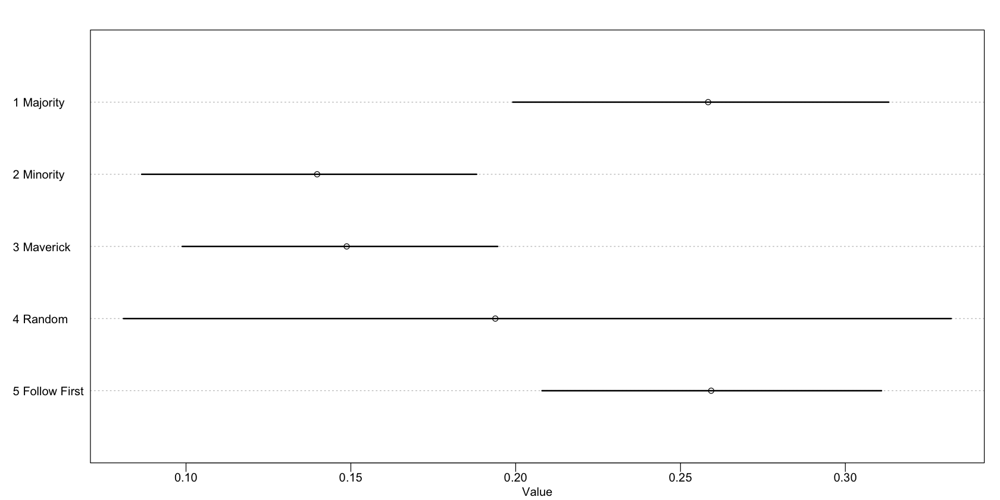

In [11]:
boxes_model_fixed <- "
data{
    int N;
    array[N] int y;
    array[N] int majority_first;
}
parameters{
    // recall that the parameters block is what we get samples for
    simplex[5] p;
}
model{
    // this bock calculates the log-probability of the variables, both observed (data) and unobserved (parameters). This is the numerator in Bayes' Theorem.

    // this is a vector holding the probability of each strategy
    vector[5] phi;
    
    // prior: [4, 4, 4, 4, 4]
    p ~ dirichlet( rep_vector(4,5) );
    
    // probability of data
    for ( i in 1:N ) {
        // OK, this one is weird
        // each entry in phi is the probability of seeing the data, conditional on that strategy being chosen
        // So this first line tells us that if we are using the majority strategy, then the probability of seeing the majority is 1 and the probability of seeing anything else is 0
        // And similarly for the others
        // so phi is really a vector of P(y_i | s)
        if ( y[i]==2 ) phi[1]=1; else phi[1]=0; // majority
        if ( y[i]==3 ) phi[2]=1; else phi[2]=0; // minority
        if ( y[i]==1 ) phi[3]=1; else phi[3]=0; // maverick
        phi[4]=1.0/3.0;                         // random
        if ( majority_first[i]==1 )             // follow first
            if ( y[i]==2 ) phi[5]=1; else phi[5]=0;
        else
            if ( y[i]==3 ) phi[5]=1; else phi[5]=0;
        
        // compute log( p_s * Pr(y_i|s )
        for ( j in 1:5 ) phi[j] = log(p[j]) + log(phi[j]);
        // compute average log-probability of y_i
        target += log_sum_exp( phi );
    }
}
"

data_list <- list(
    N = nrow(Boxes),
    y = Boxes$y,
    majority_first = Boxes$majority_first
)
m16.2.file <- write_stan_file(boxes_model_fixed)
m16.2.model <- cmdstan_model(m16.2.file)
m16.2.fit <- m16.2.model$sample(data = data_list, chains = 4)
# set_ulam_cmdstan(FALSE)
# m16.2 <- stan(model_code = boxes_model_fixed, data = data_list, chains = 3, cores = 3, rstan_out = FALSE)


p_labels <- c("1 Majority", "2 Minority", "3 Maverick", "4 Random", "5 Follow First")
par(bg = 'white')
plot(precis(m16.2.fit, depth = 2), labels = p_labels)

So we are seeing values that are consistent with about 30% of the children using a majority strategy.

This is one of the advantages of a hidden state model - we can separate strategy from behaviour.

In principle we could also make this more complicated, adding dependencies on age, gender, or whatever else we care about. We just make the $p_s$ dependent on those variables.

### State space models

The Boxes model is an example of a broader class of models, the [[State Space Model]]. These models assume that there's a hidden state (in our case, the strategy) that produce observations. Typically these are dynamic (they can change over time). When the states are discrete categories, they are called [[Hidden Markov Model]]s. 

A lot of time series will be state space models.

## Orinary differential nut cracking

*Pandas* nuts are very tasty, but have a hard covering that needs to be cracked open. People can do it, but so can chimpanzees on the Ivory Coast. They use wooden and stone tools.

In [12]:
data(Panda_nuts)
head(Panda_nuts)

,chimpanzee,age,sex,hammer,nuts_opened,seconds,help
,<int>,<int>,<fct>,<fct>,<int>,<dbl>,<fct>
1,11,3,m,G,0,61,N
2,11,3,m,G,0,37,N
3,18,4,f,wood,0,20,N
4,18,4,f,G,0,14,y
5,18,4,f,L,0,13,N
6,11,4,m,Q,0,24,N


Each row is a bout of nutcracking by one individual. The variables of interest to us at the moment are
- The outcome `nuts_opened`
- The duration `seconds` 
- The individual's `age`

We are interested in how the skill develops and which factors contribute to it.

We are interested in this because tool use in primates is rare, yet we're pretty good at it, to the point that tool use is vital to our survival.

### The scientific model

We'll start with a very simple model. Let's assume that the only important factor is strength - some chimpanzees just aren't strong enough to crack the nuts. Strength is related to body weight, which we'll model as a logistic:

$$
\frac{dM}{dt} = k(M_{\text{max}} - M_t)
$$

For which the solution is obviously

$$
M_t = M_{\text{max}}\left( 1 - e^{-kt}\right)
$$

Of course, we care about strength, not mass. Let's assume that strength $S_t$ is proportional to mass $M_t$, so $S_t = \beta M_t$.

Strength can help with nutcracking in three ways:
1. Lets them lift a heavier hammer (more momentum)
2. Lets them accelerate the hammer faster than gravity
3. Longer arms make a more efficient lever

This implies increasing returns to strength, and apparently implies a model of the form

$$
\begin{align*}
\lambda &= \alpha S_t^{\theta} \\
        &= \alpha \left( \beta M_{\text{max}} (1 - e^{-kt}) \right)^\theta
\end{align*}
$$

Where $\theta > 1$.

The new parameter $\alpha$ translates strength to nut opening (Newtons $\to$ nuts per second).

So now we have a formula for the rate of nut opening, $\lambda$. However, there's a lot of parameters there. Let's try to simplify it.

First, we'll re-scale so that $M_{\text{max}} = 1$. This gives us

$$
\lambda = \alpha \beta^\theta \left( 1 - e^{-kt}  \right)^\theta
$$

The product $\alpha \beta^\theta$ just re-scales strength to nuts opened per second, so we can replace it with a single parameter $\phi$:

$$
\lambda = \phi (1 - e^{-kt})^\theta
$$

This is definitely simpler, but as always that comes at a cost. For instance, average adult mass differs for male and female chimpanzees.

### Statistical model

Now we need a likelihood function and some priors. Assuming that the number of nuts opened is far less than the total number of nuts, the [[Poisson Distribution]] seems reasonable:

$$
\begin{align*}
n_i &\sim \text{Poisson}(\lambda_i) \\
\lambda_i &= d_i \phi (1 - e^{-kt_i})^\theta
\end{align*}
$$

Where
- $n_i$ is the number of nuts opened
- $d_i$ is the duration (time spent opening nuts)
- $t_i$ is the individual's age

The only new thing here is the exposure $d_i$.

Priors: for these we need to go back to the biology. Chimps hit their adult age at around 12 years, so we need to have the strength plateau around then. The prior for $\phi$ should have a mean around the maximum nut-opening rate, say one nut per second.

$$
\begin{align*}
\phi &\sim \text{Log-Normal}(\log 1, 0.1) \\
k &\sim \text{Log-Normal}(\log 2, 0.25) \\
\theta &\sim \text{Log-Normal}(\log 5, 0.25) \\
\end{align*}
$$

All of these are log-normal because they are positive and continuous, which is what we want.

Let's simulate from these to get an idea of the implied growth rates.

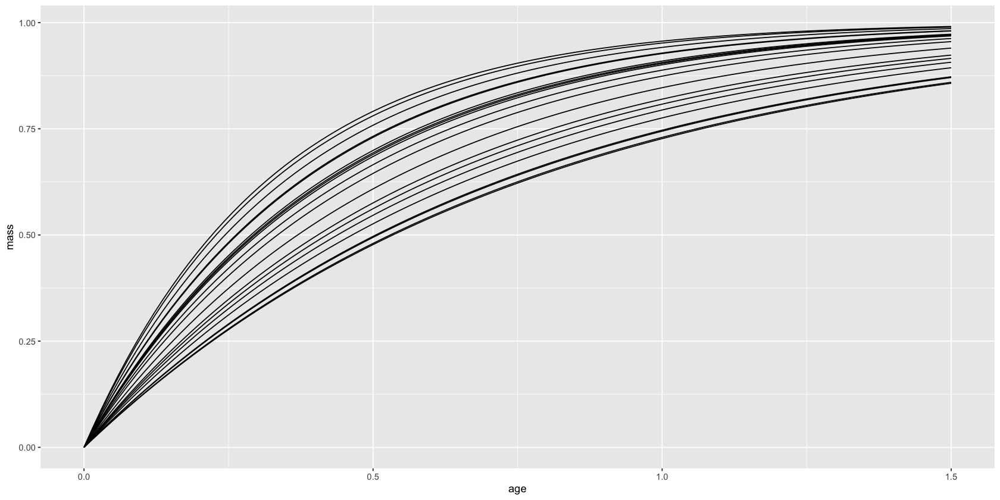

In [13]:
N <- 1e4
phi <- rlnorm(N, log(1), 0.1)
k <- rlnorm(N, log(2), 0.25)
theta <- rlnorm(N, log(5), 0.25)

# relative growth curve
# age <- seq(from = 0, to = 24, by = 1)
age <- seq(from = 0,, to = 1.5, length.out = 100)
growth_curve_df <- data.frame(run = integer(), age = numeric(), mass = numeric())

for (i in 1:20) {
    run_k <- k[i]
    run_masses <- 1 - exp(-run_k * age)
    run_df <- data.frame(run = i, age = age, mass = run_masses)
    growth_curve_df <- rbind(growth_curve_df, run_df)
}

ggplot(growth_curve_df, aes(age, mass, group = run)) +
    geom_line()

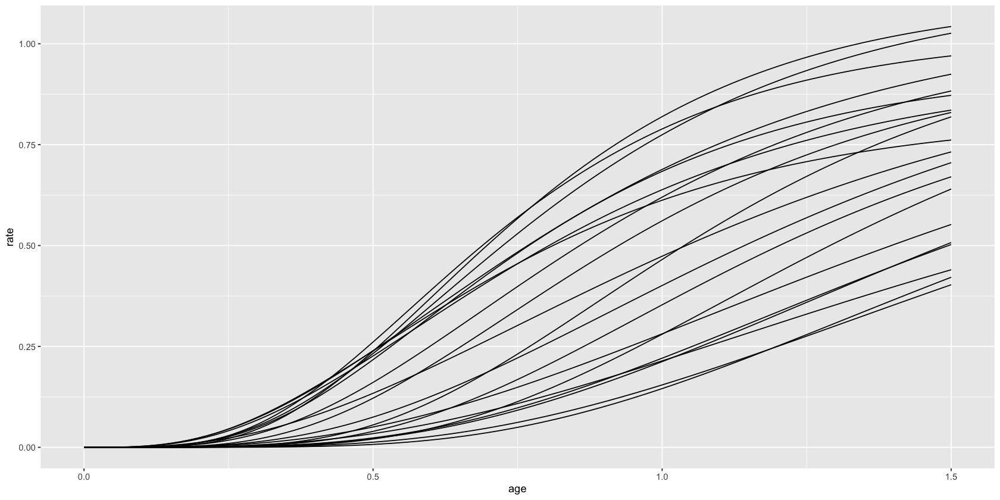

In [14]:
# now the rate of nut cracking
rate_df <- data.frame(age = numeric(), rate = numeric(), run = integer())
for (run in 1:20) {
    run_df <- data.frame(age = age, rate = phi[run] * (1 - exp(-k[run] * age)) ^ theta[run], run = run)
    rate_df <- rbind(rate_df, run_df)
}
ggplot(rate_df, aes(age, rate, group = run)) +
    geom_line()

In [15]:
# now just build the model
dat_list <- list(
    n = as.integer(Panda_nuts$nuts_opened),
    age = Panda_nuts$age / max(Panda_nuts$age),
    seconds = Panda_nuts$seconds
)

m16.4 <- ulam(
    alist(
        n ~ poisson(lambda),
        lambda <- seconds * phi * (1 - exp(-k * age)) ^ theta,
        phi ~ lognormal(log(1), 0.1),
        k ~ lognormal(log(2), 0.25),
        theta ~ lognormal(log(5), 0.25)
    ),
    data = dat_list,
    chains = 4
)

Running MCMC with 4 sequential chains, with 1 thread(s) per chain...

Chain 1 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 1 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 1 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 1 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 1 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 1 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 1 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 1 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 1 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 1 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 1 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 1 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 1 finished in 0.2 seconds.
Chain 2 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 2 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 2 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 2 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 2 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 2 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 2 Iteration: 5

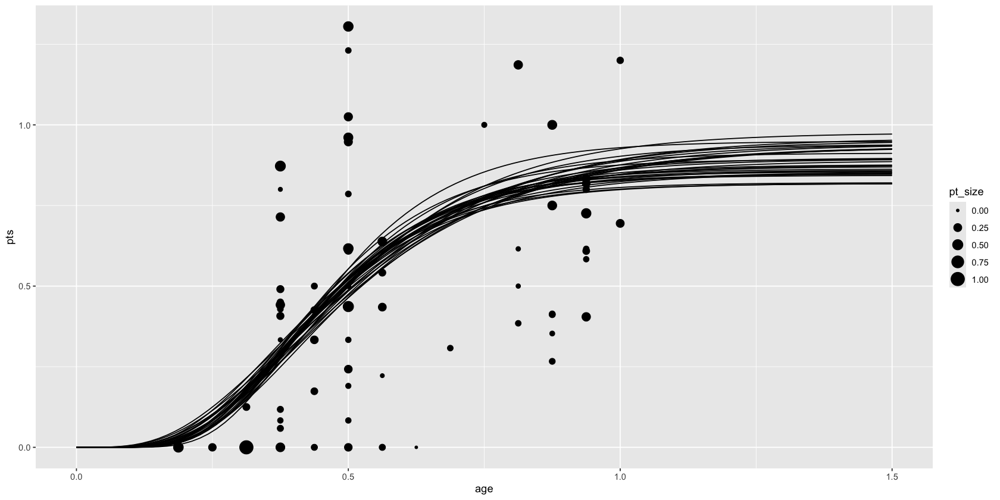

In [16]:
post <- extract.samples(m16.4)

pts <- dat_list$n / dat_list$seconds
point_size <- normalize(dat_list$seconds)
points_data <- data.frame(age = dat_list$age, pts = pts, pt_size = point_size)

curve_data <- data.frame(age = numeric(), rate = numeric(), run = integer())
for (i in 1:30) {
    curve <- post$phi[i] * (1 - exp(-post$k[i] * age)) ^ post$theta[i]
    run_df <- data.frame(age = age, rate = curve, run = i)
    curve_data <- rbind(curve_data, run_df)
}
ggplot() +
    geom_point(data = points_data, mapping = aes(age, pts, size = pt_size)) +
    geom_line(data = curve_data, mapping = aes(age, rate, group = run))

Points are the raw data and the curve is our prediction. It looks like the curves level off around the maximum age, which is consistent with our hypothesis of strength being the main factor.

### Covariates and individual diferences

This model is stupidly simple. However, it is a reasonable start. From here we could start to add in things like sex or individual strength differences. Always a good idea to start with a stupidly simple model and then layer on complexity.

Note that for some of the parameters it makes sense to vary them by individuals and for others it doesn't. For instance, $\theta$ is a product of the physics of gravity, &c., and so that should be fixed. Deciding which variables can vary by individual and which are fixed for the population depends on the scientific understanding of the principle; we can't really glean that from a statistical model.

## Population dynamics

Population of hares and lynces fluctuates over time. We'll model the population of each as a [[Time Series]].

In [52]:
data(Lynx_Hare)
head(Lynx_Hare)

,Year,Lynx,Hare
,<int>,<dbl>,<dbl>
1,1900,4.0,30.0
2,1901,6.1,47.2
3,1902,9.8,70.2
4,1903,35.2,77.4
5,1904,59.4,36.3
6,1905,41.7,20.6


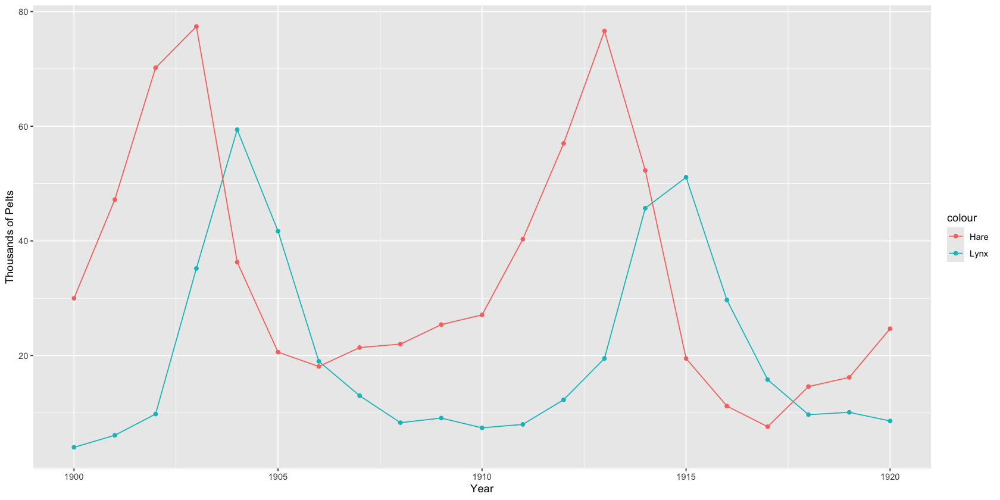

In [53]:
ggplot(Lynx_Hare, aes(Year)) +
    geom_point(aes(y = Lynx, colour = "Lynx")) +
    geom_line(aes(y = Lynx, colour = "Lynx")) +
    geom_point(aes(y = Hare, colour = "Hare")) +
    geom_line(aes(y = Hare, colour = "Hare")) +
    labs(y = "Thousands of Pelts")

A common way to model this would be to use an [[Autoregressive Model]]. In an autoregressive model, the value of the outcome of one step is dependent on the value in the previous step (which is called the 'lag variable'). For example, we might model the number of hares as

$$
E(H_t) = \alpha + \beta_1 H_{t-1}
$$

Where $H_t$ is the number of hares at time $t$. If $\beta_1$ is less than one, the number of hares will tend to regress back to some mean population level $\alpha$.

We could also add an epicycle for the predator:

$$
E(H_t) = \alpha + \beta_1 H_{t-1} + \beta_2 L_{t-1}
$$

Where $L_{t-1}$ is the number of lynx in the previous time period.

Sometimes people add deeper lags, like

$$
E(H_t) = \alpha + \beta_1 H_{t-1} + \beta_2 L_{t-1} + \beta_3 H_{t-2}
$$

We can model lots of different things this way!

There are several very famous problems with autoregressive models.
1. Nothing that happened two cycles ago can influence the present, except through the state one time period ago. Some things take longer than others to appear, but in that case you need a new variable, not a deeper lag.
2. If the state is measured with error, then we are propagating error forward. It's not the observed data $H_{t-1}$ that are influencing the state, it's the error-free $H^\ast_{t-1}$. What we really need is a [[State-Space Model]]. 
3. In most cases there is no interpretation of the parameters. For instance, the parameter $\alpha$ implies that even with no hares, there should be some in the next time period. Sometimes we don't care (we just want the predictions), but even then the lack of physical meaning means that the predictions are suspect.

It's easy to do better using [[Ordinary Differential Equations]]!

### The scientific model

Hares reproduce at a rate that depends on plants and it shrinks at a rate dependent on the number of predators. Let $H_t$ be the number of hares at time $t$. Then

$$
\frac{dH}{dt} = H_t \times (\text{birth rate}) - H_t * (\text{death rate})
$$

Reproduction and death are *per capita* processes. The simplest model holds the birth and death rates constant. Let's call them $b_H$ and $m_H$.

$$
\frac{dH}{dt} = H_t b_H - H_t m_H = H_t (b_H - m_H)
$$

The result $b_H - m_H$ we call the per capita growth rate.

However, we need to account for the lynx. That changes the death rate:

$$
\frac{dH}{dt} = H_t (b_H - L_t m_H)
$$

The same logic gives us a very similar formula for the change in the lynx population

$$
\frac{dL}{dT} = L_t (H_t b_L - m_L)
$$

So the population dynamics of both species are determined by a pair of coupled ODEs. This isn't totally realistic - plants aren't always available and lynx eat other things than hares (and hares are eaten by more things than lynx), but as always we start with a simple model and potentially add complexity later.

This is the [[Lotka-Volterra Model]].

We can't actually solve this explicitly; we need to do it numerically.

$$
H_{t + dt} = H_t + dt \frac{dH}{dT} = H_t + dt H_t (b_H - L_t m_H)
$$

We need to be really careful here because computers are bad at math, but this should be good enough for now.

Let's write it as a function:

In [54]:
sim_lynx_hare <- function(n_steps, init, theta, dt = 0.002) {
    L <- rep(NA, n_steps)
    H <- rep(NA, n_steps)
    L[1] <- init[1]
    H[1] <- init[2]

    for (i in 2:n_steps) {
        H[i] <- H[i - 1] + dt * H[i - 1] * (theta[1] - theta[2] * L[i - 1])
        L[i] <- L[i - 1] + dt * L[i - 1] * (theta[3] * H[i - 1] - theta[4])
    }
    return(cbind(L, H))
}

In [55]:
theta <- c(0.5, 0.05, 0.025, 0.5)
z <- sim_lynx_hare(1e4, as.numeric(Lynx_Hare[1, 2:3]), theta)
head(z)

L,H
4.000000,30.00000
4.002000,30.01800
4.004005,30.03600
4.006014,30.05401
4.008028,30.07203
4.010046,30.09005


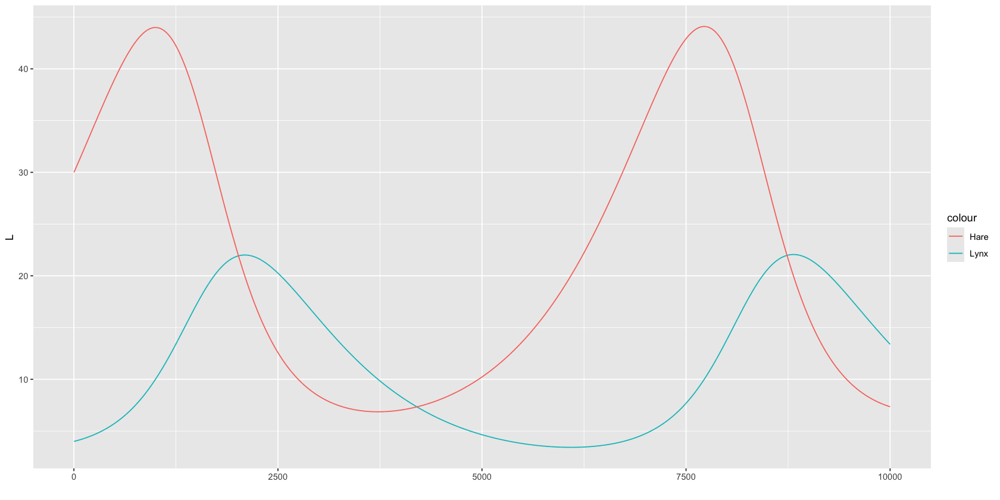

In [56]:
plot_df <- cbind(data.frame(t = 1:nrow(z)), z)

ggplot(plot_df, aes(t)) +
    geom_line(aes(y = L, colour = "Lynx")) +
    geom_line(aes(y = H, colour = "Hare")) +
    labs(x = "")

### The statistical model

Now we need to connect the deterministic popluation dynamics to the observed data. We need to model both the underlying population dynamics and the observation / collection process.

If $H_t$ and $L_t$ represent the true popluations, let's let $h_t$ and $l_t$ represent the observed values. They don't cause anything, but we can hopefully use them to try to make inferences about the true populations.

To do this, let's assign an error distribution to the observation process. We need to outline the generative process that goes from the true state $H_t$ to the observed state $h_t$. First, the hares get trapped. Say that each hare is trapped with a probability $p_t$, which varies from year to year. In addition, the actualy number of pelts were not recorded. Instead, they were rounded to the nearest 100 and then divided by 1000. It's a bit of a mess.

We can deal with all of this though. Say we have a population of $H_t = 1e4$ hares. Say also that the trapping rate $p_t$ comes from a distribution $p_t \sim \text{Beta}(2, 18)$. This roughly means that the average trapping rate is 10% and it's rare to get, say, double that. We can get a binomial count of the number of pelts and then round to the nearest 100 and divide by 1000.

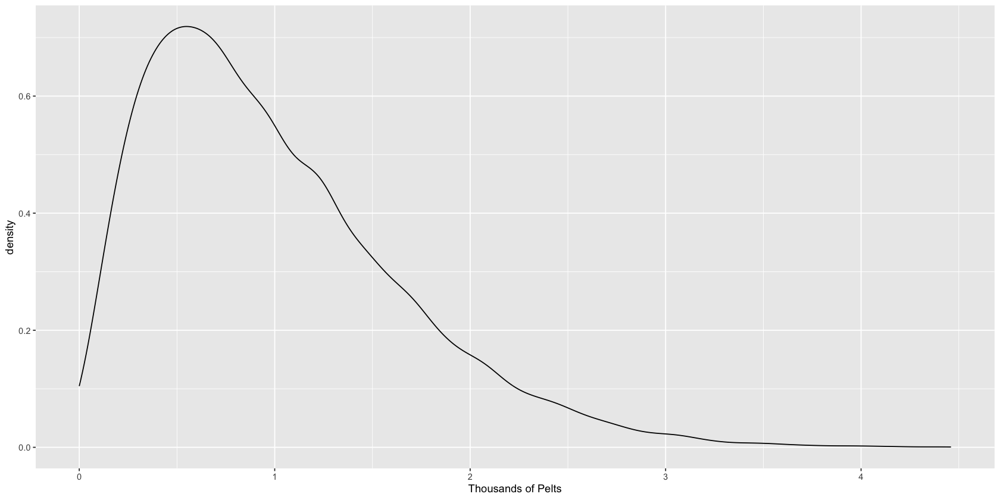

In [57]:
N <- 1e4
Ht <- 1e4
p <- rbeta(N, 2, 18)
h <- rbinom(N, size = Ht, prob = p)
h <- round(h / 1000, 2)

ggplot(data.frame(h = h), aes(h)) +
    geom_density() +
    labs(x = "Thousands of Pelts")

So this is not great. Our sampling / error is such that a fixed population of 10 000 hares can be represented by anything from 0 - roughly 3000 pelts.

There are a few reasonable ways to approximate this distribution. The log-normal seems reasonable - it has the right constraints and skew. For instance, we could say

$$
h_t \sim \text{Log-Normal}(\log(pH_t), \sigma_H)
$$

This gives $h_t$ a median of $p H_t$, the expected proportion of the hare population which is trapped. The parameter $\sigma_H$ controls the dispersion. One important thing that we've learnt from this model already is that there's no good way to estimate $p$ - instead, we constrain it with a strong prior.

We're going to ignore the rounding error, because it is at most $50 / 4000 \approx 1.25\%$. It just doesn't seem worth the effort, but in principle it's not hard to do.

Observed variables:
$$
\begin{align*}
h_t &\sim \text{Log-Normal}(\log (p_H H_t), \sigma_H) \\
l_t &\sim \text{Log-Normal}(\log (p_L L_t), \sigma_L)
\end{align*}
$$

Unobserved variables:
$$
\begin{align*}
H_1 &\sim \text{Log-Normal}(\log 10, 1) \\
L_1 &\sim \text{Log-Normal}(\log 10, 1) \\
H_{T > 1} &= H_1 + \int_1^T H_t (b_H - m_H L_t) dt \\
L_{T > 1} &= L_1 + \int_1^T L_t (b_L H_t - m_L) dt \\
\end{align*}
$$

And finally, we need some priors:

$$
\begin{align*}
\sigma_H &\sim \text{Exponential}(1) \\
\sigma_L &\sim \text{Exponential}(1) \\
p_H &\sim \text{Beta}(\alpha_H, \beta_H) \\
p_L &\sim \text{Beta}(\alpha_L, \beta_L) \\
b_H &\sim \text{Half-Normal}(1, 0.5) \\
b_L &\sim \text{Half-Normal}(0.05, 0.05) \\
m_H &\sim \text{Half-Normal}(0.05, 0.05) \\
m_L &\sim \text{Half-Normal}(1, 0.5) \\
\end{align*}
$$

The main trick here is that we need to re-write the numerical integrator in [[Stan]]. Luckily, it already has lots of stuff to do that for us, so we don't need to worry about it.

In [58]:
data(Lynx_Hare_model)
cat(Lynx_Hare_model)

functions {
  array[] real dpop_dt(real t, // time
                       array[] real pop_init,
                       // initial state {lynx, hares}
                       array[] real theta, // parameters
                       array[] real x_r, array[] int x_i) {
    // unused
    real L = pop_init[1];
    real H = pop_init[2];
    real bh = theta[1];
    real mh = theta[2];
    real ml = theta[3];
    real bl = theta[4];
    // differential equations
    real dH_dt = (bh - mh * L) * H;
    real dL_dt = (bl * H - ml) * L;
    return {dL_dt, dH_dt};
  }
}
data {
  int<lower=0> N; // number of measurement times
  array[N, 2] real<lower=0> pelts; // measured populations
}
transformed data {
  array[N - 1] real times_measured; // N-1 because first time is initial state
  for (i in 2 : N) 
    times_measured[i - 1] = i;
}
parameters {
  array[4] real<lower=0> theta; // { bh, mh, ml, bl }
  array[2] real<lower=0> pop_init; // initial population state
  array[2] real<lower=0> sigma; // me

There are a few unusual pieces here.

First is the `dpop_dt` function at the top. This computes the rate of change of the hare and lynx populations for use in the numerical integrator. Then we take the outputs of that and send it to [[Stan]]'s `integrate_ode_rk45` function which handles the numerical integration for us.

In [59]:
data_list <- list(
    N = nrow(Lynx_Hare),
    pelts = Lynx_Hare[, 2:3]
)

stan_model_code <- "functions {
  array[] real dpop_dt( real t,                 // time
                array[] real pop_init,          // initial state {lynx, hares}
                array[] real theta,             // parameters
                array[] real x_r, array[] int x_i) {  // unused
    real L = pop_init[1];
    real H = pop_init[2];
    real bh = theta[1];
    real mh = theta[2];
    real ml = theta[3];
    real bl = theta[4];
    // differential equations
    real dH_dt = (bh - mh * L) * H;
    real dL_dt = (bl * H - ml) * L;
    return { dL_dt , dH_dt };
  }
}
data {
  int<lower=0> N;              // number of measurement times
  array[N] vector<lower=0>[2] pelts;    // measured populations
}
transformed data{
  array[N-1] int times_measured;    // N-1 because first time is initial state
  for ( i in 2:N ) times_measured[i-1] = i;
}
parameters {
  array[4] real<lower=0> theta;      // { bh, mh, ml, bl }
  array[2] real<lower=0> pop_init;   // initial population state
  array[2] real<lower=0> sigma;      // measurement errors
  array[2] real<lower=0,upper=1> p;  // trap rate
}
transformed parameters {
  array[N, 2] real pop;
  pop[1,1] = pop_init[1];
  pop[1,2] = pop_init[2];
  pop[2:N,1:2] = integrate_ode_rk45(
    dpop_dt, pop_init, 0, times_measured, theta,
    rep_array(0.0, 0), rep_array(0, 0),
    1e-5, 1e-3, 5e2);
}
model {
  // priors
  theta[{1,3}] ~ normal( 1 , 0.5 );    // bh,ml
  theta[{2,4}] ~ normal( 0.05, 0.05 ); // mh,bl
  sigma ~ exponential( 1 );
  pop_init ~ lognormal( log(10) , 1 );
  p ~ beta(40,200);
  // observation model
  // connect latent population state to observed pelts
  for ( t in 1:N )
    for ( k in 1:2 )
      pelts[t,k] ~ lognormal( log(pop[t,k]*p[k]) , sigma[k] );
}
generated quantities {
  array[N] vector[2] pelts_pred;
  for ( t in 1:N )
    for ( k in 1:2 )
      pelts_pred[t,k] = lognormal_rng( log(pop[t,k]*p[k]) , sigma[k] );
}"

stan_file <- write_stan_file(stan_model_code)
stan_model <- cmdstan_model(stan_file)
fit <- stan_model$sample(
    data = data_list,
    chains = 4,
    parallel_chains = 4
)
# m16.5 <- stan(model_code = Lynx_Hare_model, data = dat_list, chains = 4, cores = 4, control = list(adapt_delta = 0.95))

Warning in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b47772785.stan', line 36, column 17: integrate_ode_rk45
    is deprecated and will be removed in Stan 3.0. Use ode_rk45 instead. 
    The new interface is slightly different, see:
    https://mc-stan.org/users/documentation/case-studies/convert_odes.html




Running MCMC with 4 parallel chains...



Chain 1 Rejecting initial value:

Chain 1   Error evaluating the log probability at the initial value.

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b47772785.stan', line 52, column 6 to column 62)

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b47772785.stan', line 52, column 6 to column 62)

Chain 1 Rejecting initial value:

Chain 1   Error evaluating the log probability at the initial value.

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b47772785.stan', line 52, column 6 to column 62)

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b47772785.stan', l

Chain 1 Iteration:    1 / 2000 [  0%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: integrate_ode_rk45: initial state[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b47772785.stan', line 36, column 2 to line 39, column 21)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: integrate_ode_rk45: initial state[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b47772785.stan', line 36, column 2 to line 39, column 21)

Chain 1 If this warning occurs sporadically, such as for h

Chain 2 Iteration:    1 / 2000 [  0%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b47772785.stan', line 52, column 6 to column 62)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b47772785.stan', line 52, column 6 to column 62)

Chain 2 If this warning occurs sporadically, such as for highly constrained vari

Chain 3 Iteration:    1 / 2000 [  0%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: integrate_ode_rk45: initial state[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b47772785.stan', line 36, column 2 to line 39, column 21)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: integrate_ode_rk45: initial state[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b47772785.stan', line 36, column 2 to line 39, column 21)

Chain 3 If this warning occurs sporadically, such as for h

Chain 4 Iteration:    1 / 2000 [  0%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: integrate_ode_rk45:  Failed to integrate to next output time (2) in less than max_num_steps steps (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b47772785.stan', line 36, column 2 to line 39, column 21)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: integrate_ode_rk45:  Failed to integrate to next output time (2) in less than max_num_steps steps (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b47772785.stan', line 36, column 2 to line 39, colu

Chain 1 Iteration:  100 / 2000 [  5%]  (Warmup) 
Chain 2 Iteration:  100 / 2000 [  5%]  (Warmup) 
Chain 3 Iteration:  100 / 2000 [  5%]  (Warmup) 
Chain 4 Iteration:  100 / 2000 [  5%]  (Warmup) 
Chain 2 Iteration:  200 / 2000 [ 10%]  (Warmup) 
Chain 3 Iteration:  200 / 2000 [ 10%]  (Warmup) 
Chain 1 Iteration:  200 / 2000 [ 10%]  (Warmup) 
Chain 4 Iteration:  200 / 2000 [ 10%]  (Warmup) 
Chain 2 Iteration:  300 / 2000 [ 15%]  (Warmup) 
Chain 4 Iteration:  300 / 2000 [ 15%]  (Warmup) 
Chain 3 Iteration:  300 / 2000 [ 15%]  (Warmup) 
Chain 2 Iteration:  400 / 2000 [ 20%]  (Warmup) 
Chain 1 Iteration:  300 / 2000 [ 15%]  (Warmup) 
Chain 4 Iteration:  400 / 2000 [ 20%]  (Warmup) 
Chain 2 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 3 Iteration:  400 / 2000 [ 20%]  (Warmup) 
Chain 4 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 1 Iteration:  400 / 2000 [ 20%]  (Warmup) 
Chain 2 Iteration:  600 / 2000 [ 30%]  (Warmup) 
Chain 4 Iteration:  600 / 2000 [ 30%]  (Warmup) 
Chain 3 Iteration:  

In [60]:
post <- as_draws_df(fit)
head(post)

Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”


lp__,theta[1],theta[2],theta[3],theta[4],pop_init[1],pop_init[2],sigma[1],sigma[2],p[1],⋯,"pelts_pred[15,2]","pelts_pred[16,2]","pelts_pred[17,2]","pelts_pred[18,2]","pelts_pred[19,2]","pelts_pred[20,2]","pelts_pred[21,2]",.chain,.iteration,.draw
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>
-240.145,0.518078,0.00375704,0.789835,0.00509571,46.4403,117.231,0.215053,0.238894,0.139405,⋯,57.7068,27.2098,18.5706,14.4941,13.2928,25.5909,30.6822,1,1,1
-240.200,0.553350,0.00491576,0.802402,0.00450074,39.0171,123.041,0.248290,0.212464,0.159455,⋯,30.3758,26.8682,13.3618,14.2002,18.5607,18.5555,44.9838,1,2,2
-242.512,0.544617,0.00432040,0.824433,0.00406849,42.3158,138.119,0.372516,0.260789,0.169613,⋯,119.7810,26.5816,12.9188,19.9697,19.4641,34.3330,31.0819,1,3,3
-239.964,0.488305,0.00382908,0.895033,0.00477430,39.6596,140.230,0.256982,0.230346,0.145038,⋯,54.7284,29.6851,14.6712,14.6272,20.2181,24.3581,36.7968,1,4,4
-239.175,0.529713,0.00477383,0.800332,0.00422196,32.7964,136.044,0.251617,0.246621,0.190074,⋯,58.9142,36.5677,12.7949,14.1149,14.6415,14.8470,27.2283,1,5,5
-243.388,0.489451,0.00364764,0.913257,0.00532911,39.0941,124.119,0.197217,0.208750,0.152424,⋯,36.2454,31.3889,16.7929,13.2723,18.0913,25.4980,39.0892,1,6,6


In [61]:
colnames(post)

[1] "lp__"             "theta[1]"         "theta[2]"         "theta[3]"        
 [5] "theta[4]"         "pop_init[1]"      "pop_init[2]"      "sigma[1]"        
 [9] "sigma[2]"         "p[1]"             "p[2]"             "pop[1,1]"        
[13] "pop[2,1]"         "pop[3,1]"         "pop[4,1]"         "pop[5,1]"        
[17] "pop[6,1]"         "pop[7,1]"         "pop[8,1]"         "pop[9,1]"        
[21] "pop[10,1]"        "pop[11,1]"        "pop[12,1]"        "pop[13,1]"       
[25] "pop[14,1]"        "pop[15,1]"        "pop[16,1]"        "pop[17,1]"       
[29] "pop[18,1]"        "pop[19,1]"        "pop[20,1]"        "pop[21,1]"       
[33] "pop[1,2]"         "pop[2,2]"         "pop[3,2]"         "pop[4,2]"        
[37] "pop[5,2]"         "pop[6,2]"         "pop[7,2]"         "pop[8,2]"        
[41] "pop[9,2]"         "pop[10,2]"        "pop[11,2]"        "pop[12,2]"       
[45] "pop[13,2]"        "pop[14,2]"        "pop[15,2]"        "pop[16,2]"       
[49] "pop[17,2]"        "pop[18,2]"        "pop[19,2]"        "pop[20,2]"       
[53] "pop[21,2]"        "pelts_pred[1,1]"  "pelts_pred[2,1]"  "pelts_pred[3,1]" 
[57] "pelts_pred[4,1]"  "pelts_pred[5,1]"  "pelts_pred[6,1]"  "pelts_pred[7,1]" 
[61] "pelts_pred[8,1]"  "pelts_pred[9,1]"  "pelts_pred[10,1]" "pelts_pred[11,1]"
[65] "pelts_pred[12,1]" "pelts_pred[13,1]" "pelts_pred[14,1]" "pelts_pred[15,1]"
[69] "pelts_pred[16,1]" "pelts_pred[17,1]" "pelts_pred[18,1]" "pelts_pred[19,1]"
[73] "pelts_pred[20,1]" "pelts_pred[21,1]" "pelts_pred[1,2]"  "pelts_pred[2,2]" 
[77] "pelts_pred[3,2]"  "pelts_pred[4,2]"  "pelts_pred[5,2]"  "pelts_pred[6,2]" 
[81] "pelts_pred[7,2]"  "pelts_pred[8,2]"  "pelts_pred[9,2]"  "pelts_pred[10,2]"
[85] "pelts_pred[11,2]" "pelts_pred[12,2]" "pelts_pred[13,2]" "pelts_pred[14,2]"
[89] "pelts_pred[15,2]" "pelts_pred[16,2]" "pelts_pred[17,2]" "pelts_pred[18,2]"
[93] "pelts_pred[19,2]" "pelts_pred[20,2]" "pelts_pred[21,2]" ".chain"          
[97] ".iteration"       ".draw"

Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as requi

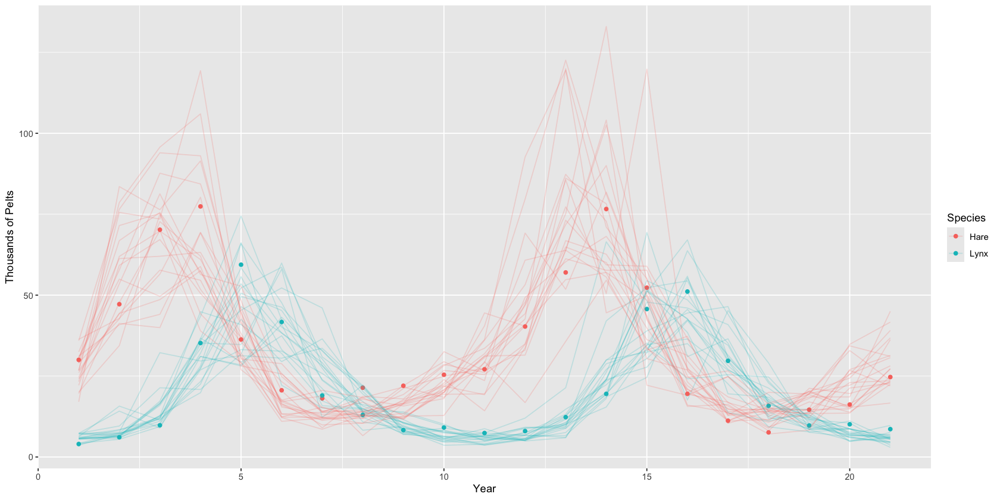

In [62]:
years <- 1:21
pred_df <- data.frame(year = numeric(), lynx_pred = numeric(), hare_pred = numeric(), run = integer())
for (i in 1:20) {
    lynx_pred <- post[i, paste('pelts_pred[', years, ',1]', sep = '')]
    lynx_pred <- t(lynx_pred) # long format
    # now strip the names
    colnames(lynx_pred) <- NULL
    rownames(lynx_pred) <- NULL
    hare_pred <- post[i, paste('pelts_pred[', years, ',2]', sep = '')]
    hare_pred <- t(hare_pred) # long format
    # now strip the names
    colnames(hare_pred) <- NULL
    rownames(hare_pred) <- NULL
    # hare_pred <- post[i, paste('pelts_pred[', years, ',2]', sep = '')]
    run_df <- data.frame(year = years, lynx_pred = lynx_pred, hare_pred = hare_pred, run = i)
    pred_df <- rbind(pred_df, run_df)
}

normalized_year_data <- data.frame(year = years, lynx = Lynx_Hare$Lynx, hare = Lynx_Hare$Hare)

ggplot() +
    geom_point(data = normalized_year_data, mapping = aes(year, hare, colour = "Hare")) +
    geom_point(data = normalized_year_data, mapping = aes(year, lynx, colour = "Lynx")) +
    geom_line(data = pred_df, mapping = aes(year, lynx_pred, colour = "Lynx", group = run), alpha = 0.2) +
    geom_line(data = pred_df, mapping = aes(year, hare_pred, colour = "Hare", group = run), alpha = 0.2) +
    labs(x = "Year", y = "Thousands of Pelts", colour = "Species")

Notice the jaggedness - this is a result of the assumption that errors across time points are uncorrelated. In this case it's actually a feature, not a bug - autoregressive models will assume that the previous time step caused the current one, which can lead to error propagation. Now instead of looking at pelts, let's look at our estimates of the underlying population.

Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as requi

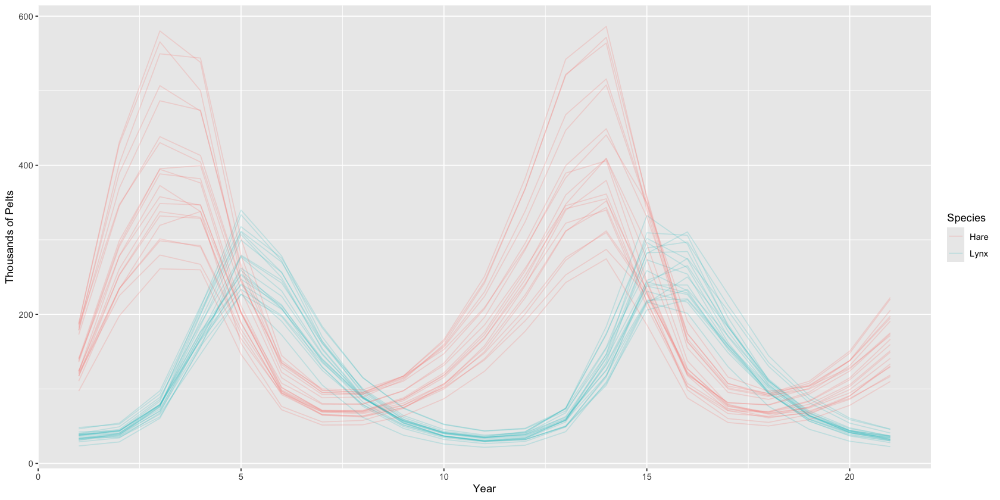

In [63]:
years <- 1:21
pred_df <- data.frame(year = numeric(), lynx_pred = numeric(), hare_pred = numeric(), run = integer())
for (i in 1:20) {
    lynx_pred <- post[i, paste('pop[', years, ',1]', sep = '')]
    lynx_pred <- t(lynx_pred) # long format
    # now strip the names
    colnames(lynx_pred) <- NULL
    rownames(lynx_pred) <- NULL
    hare_pred <- post[i, paste('pop[', years, ',2]', sep = '')]
    hare_pred <- t(hare_pred) # long format
    # now strip the names
    colnames(hare_pred) <- NULL
    rownames(hare_pred) <- NULL
    # hare_pred <- post[i, paste('pelts_pred[', years, ',2]', sep = '')]
    run_df <- data.frame(year = years, lynx_pred = lynx_pred, hare_pred = hare_pred, run = i)
    pred_df <- rbind(pred_df, run_df)
}

ode_plot <- ggplot() +
    geom_line(data = pred_df, mapping = aes(year, lynx_pred, colour = "Lynx", group = run), alpha = 0.2) +
    geom_line(data = pred_df, mapping = aes(year, hare_pred, colour = "Hare", group = run), alpha = 0.2) +
    labs(x = "Year", y = "Thousands of Pelts", colour = "Species")
print(ode_plot)

Note that here the curves actually are quite smooth, since the past population does in fact cause the population in the next step.

### Lynx lessons

There is considerable reason to doubt that this is a good model. It turns out that lynx do depend almost entirely on hares for food, but hares are eaten by basically anything big enought to catch them, meaning that we have some confounds here.

## Practice

**16RE1** What are some disadvantages of generalized linear models (GLMs)?

**Answer** There are a few disadvantages to GLMs. The first is that not all phenomena can be modelled as a GLM; some theories just don't have that structure. Another disadvantage is that since a GML is not necessarily tied to a theory of the outcome being studied, the parameters can lack physical meaning.

**16E2 & 16E3** Can you think of one or more famous scientific models which do not have the additive structure of a GLM? Some models don't look like a GLM at first, but can be transformed through the logarithm to an additive combination of terms. Do you know any models like this?

**Answer** Many multiplicative models don't (initially) have the additive structure of a GLM. For instance, Einstein's $E = mc^2$ equation doesn't initially have the form of a GLM. However, by taking the logarithm ($\log E = \log m + 2 \log c$) we get the desired shape.

**16M1** Modify the cylinder height model, `m16.1`, so that the exponent 3 on height is instead a free parameter. Do you recover the value of 3 or not? Plot the posterior predictions for the new model. How do they differ from those of `m16.1`?

**Answer**

In [64]:
data(Howell1)
d <- Howell1

d$w <- d$weight / mean(d$weight)
d$h <- d$height / mean(d$height)

m16m1 <- ulam(
    alist(
        w ~ dlnorm(mu, sigma),
        exp(mu) <- 3.141593 * k * p^2 * h^ex,
        p ~ beta(2, 18),
        k ~ exponential(0.5),
        ex ~ log_normal(3, 0.5),
        sigma ~ exponential(1)
    ),
    data = d,
    chains = 4,
    cores = 4
)

m16.1 <- ulam(
    alist(
        w ~ dlnorm(mu, sigma),
        exp(mu) <- 3.141593 * k * p^2 * h^3,
        p ~ beta(2, 18),
        k ~ exponential(0.5),
        sigma ~ exponential(1)
    ),
    data = d,
    chains = 4,
    cores = 4
)

precis(m16m1)

Running MCMC with 4 parallel chains, with 1 thread(s) per chain...

Chain 1 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b8ec925.stan', line 25, column 4 to column 32)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b8ec925.stan', line 25, column 4 to column 32)

Chain 1 If this warning occurs sporadically, such as for highly constrained va

Chain 2 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b8ec925.stan', line 25, column 4 to column 32)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b8ec925.stan', line 25, column 4 to column 32)

Chain 2 If this warning occurs sporadically, such as for highly constrained va

Chain 3 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is -inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b8ec925.stan', line 25, column 4 to column 32)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 



Chain 4 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b8ec925.stan', line 25, column 4 to column 32)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b8ec925.stan', line 25, column 4 to column 32)

Chain 4 If this warning occurs sporadically, such as for highly constrained va

Chain 1 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 3 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 2 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 4 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 1 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 3 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 4 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 2 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 3 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 4 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 1 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 2 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 3 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 4 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 2 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 1 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 3 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 3 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 2 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 2 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 4 Iteration: 500 / 1000 [ 50%]

See https://mc-stan.org/misc/warnings for details.




Running MCMC with 4 parallel chains, with 1 thread(s) per chain...

Chain 1 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b7c666a5f.stan', line 23, column 4 to column 32)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b7c666a5f.stan', line 23, column 4 to column 32)

Chain 1 If this warning occurs sporadically, such as for highly constraine

Chain 2 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b7c666a5f.stan', line 23, column 4 to column 32)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 



Chain 3 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b7c666a5f.stan', line 23, column 4 to column 32)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b7c666a5f.stan', line 23, column 4 to column 32)

Chain 3 If this warning occurs sporadically, such as for highly constraine

Chain 4 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter[1] is -inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b7c666a5f.stan', line 23, column 4 to column 32)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 



Chain 1 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 2 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 3 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 4 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 1 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 3 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 4 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 2 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 1 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 3 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 2 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 4 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 3 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 2 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 1 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 4 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 3 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 3 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 2 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 2 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 4 Iteration: 500 / 1000 [ 50%]

,mean,sd,5.5%,94.5%,rhat,ess_bulk
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
p,0.2471025,0.057908369,0.1672309,0.3509149,1.005132,608.0421
k,5.6905161,2.725996862,2.4028717,10.5628135,1.004277,609.1067
ex,2.3268632,0.022005341,2.2934119,2.3625071,1.006851,1173.3325
sigma,0.1264283,0.003773587,0.1204880,0.1325802,1.008468,1014.0263


Interestingly, we don't recover three as the exponent, probably because of allometric growth.

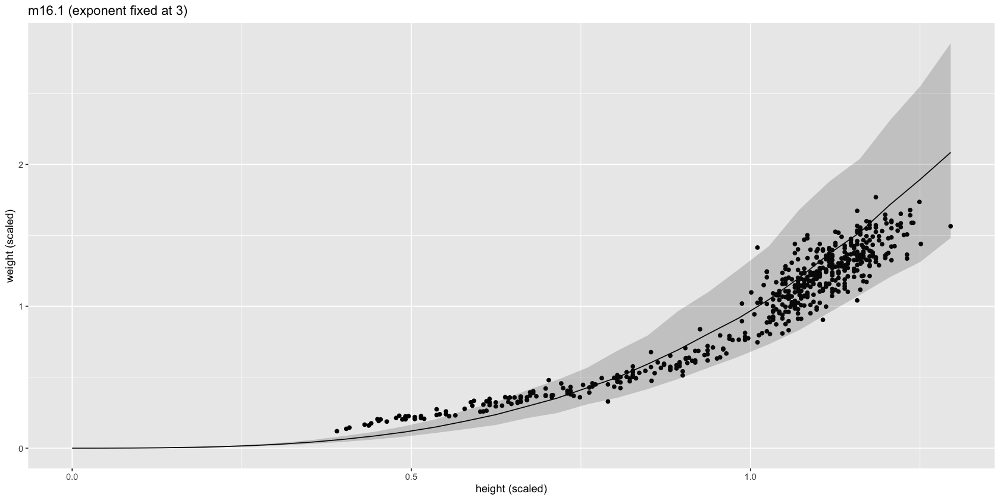

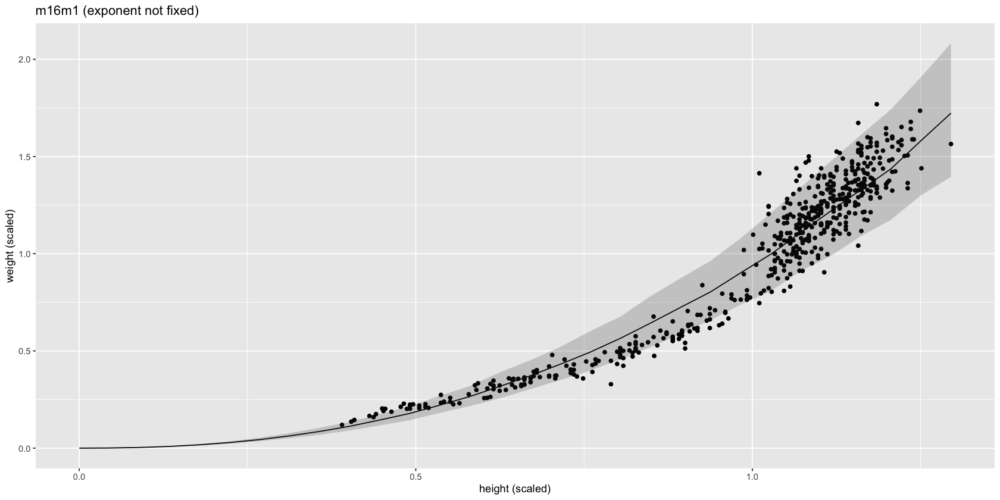

In [65]:
# m16.1
h_seq <- seq(from = 0, to = max(d$h), length.out = 30)
w_sim <- sim(m16.1, data = list(h = h_seq))
mu_mean <- apply(w_sim, 2, mean)
w_CI <- apply(w_sim, 2, PI)

# w_CI
sim_df <- data.frame(
    h = h_seq,
    mean = mu_mean,
    lower = w_CI[1, ],
    upper = w_CI[2, ]
)

m16.1.plot <- ggplot() +
    geom_point(data = d, mapping = aes(h, w)) +
    geom_line(data = sim_df, mapping = aes(h, mean)) +
    geom_ribbon(data = sim_df, mapping = aes(h, ymin = lower, ymax = upper), alpha = 0.2) +
    labs(x = 'height (scaled)', y = 'weight (scaled)', title = 'm16.1 (exponent fixed at 3)')

# m16m1
h_seq <- seq(from = 0, to = max(d$h), length.out = 30)
w_sim <- sim(m16m1, data = list(h = h_seq))
mu_mean <- apply(w_sim, 2, mean)
w_CI <- apply(w_sim, 2, PI)

# w_CI
sim_df <- data.frame(
    h = h_seq,
    mean = mu_mean,
    lower = w_CI[1, ],
    upper = w_CI[2, ]
)

m16m1.plot <- ggplot() +
    geom_point(data = d, mapping = aes(h, w)) +
    geom_line(data = sim_df, mapping = aes(h, mean)) +
    geom_ribbon(data = sim_df, mapping = aes(h, ymin = lower, ymax = upper), alpha = 0.2) +
    labs(x = 'height (scaled)', y = 'weight (scaled)', title = "m16m1 (exponent not fixed)")

print(m16.1.plot)
print(m16m1.plot)

While the predictions of `m16m1` are similar to those of `m16.1`, they do a better job accounting for the mass at low ages. This is not surprising - by making the exponent a free variable we expect the fit to only get better.

**16M2** Conduct a prior predictive simulation for the cylinder height model. Begin with the priors in the chapter. Do these produce reasonable prior height distributions? If no, which modifications do you suggest?

**Answer**

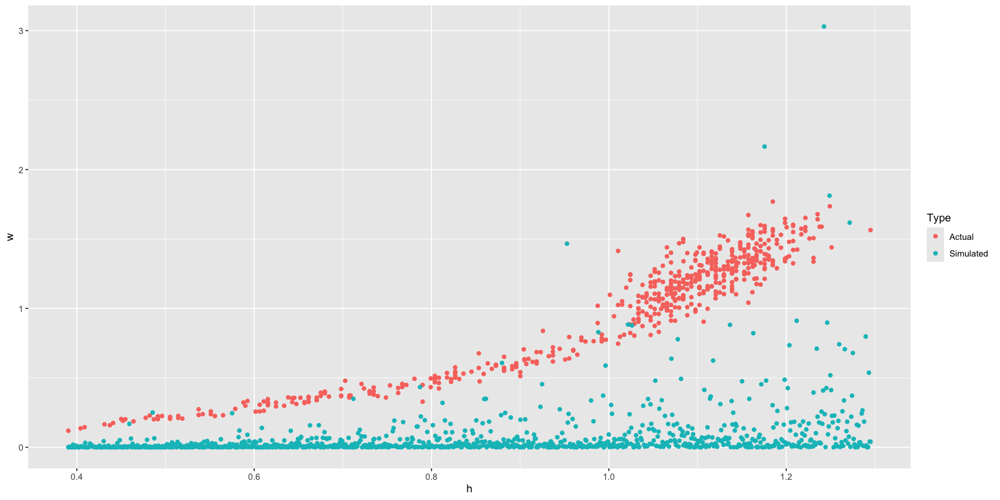

In [66]:
data(Howell1)
d <- Howell1

d$w <- d$weight / mean(d$weight)
d$h <- d$height / mean(d$height)

N <- 1e3
# h_sim <- runif(N, min(d$h), max(d$h))
h_sim <- seq(from = min(d$h), to = max(d$h), length.out = N)
k <- rexp(N, 0.5)
p <- rbeta(N, 2, 18)
mu <- 3.14 * k * p^2 * h_sim^3
sigma <- rexp(N, 1)
w_sim <- mu

data_df <- data.frame(
    w = d$w,
    h = d$h,
    type = "Actual"
)
sim_df <- data.frame(
    w = w_sim,
    h = h_sim,
    type = "Simulated"
)

plot_df <- rbind(data_df, sim_df)

ggplot(plot_df, aes(h, w, colour = type)) +
    geom_point() +
    labs(colour = "Type")

No, this prior is not all that great. The priors are a lot 'flatter' than the data would indicate.

[1] 3.746719e-04 1.048166e+01

[1] 0.0006591543 6.5714788265

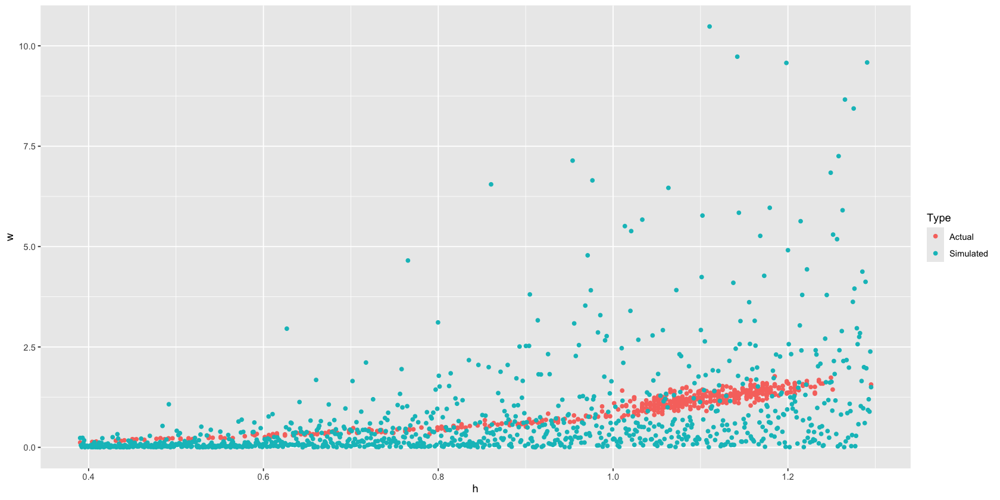

In [67]:
N <- 1e3
# h_sim <- runif(N, min(d$w), max(d$w))
h_sim <- seq(from = min(d$h), to = max(d$h), length.out = N)
k <- rlnorm(N, 3, 0.1)
p <- rbeta(N, 2, 18)
mu <- 3.14 * k * ( p^2 ) * ( h_sim^3 )
w_sim <- mu

data_df <- data.frame(
    w = d$w,
    h = d$h,
    type = "Actual"
)
sim_df <- data.frame(
    w = w_sim,
    h = h_sim,
    type = "Simulated"
)
range(mu)
range(sigma)

plot_df <- rbind(
    data_df,
    sim_df
)

ggplot(plot_df, aes(h, w, colour = type)) +
    geom_point() +
    labs(colour = "Type") 
    # coord_cartesian(ylim = c(0, 2))

By modifying the prior on $k$ to make it log-normally distributed as well as increasing its value, we get a slightly better fit to the data.

**16M3** Use prior predictive simulations to investigate the hare-lynx model. Begin with the priors in the chapter. Which population dynamics do these produce? Can you suggest any improvements to the priors, on the basis of your simulation?

**Answer**

Luckily we already have a function to simulate the populations: `sim_lynx_hare`. For the actual priors, the book is using a half-normal distribution with both a mean and sd; however, most of the actual functions for the half-normal only use the sd, not the mean. There's a way to do it in Stan (see the model), but I don't feel like doing that. Instead, I'll just use the normal distribution.

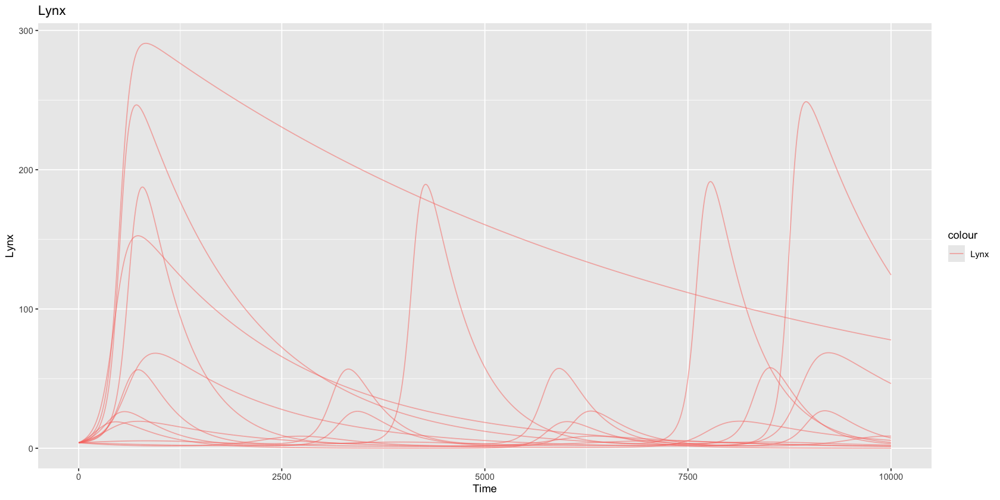

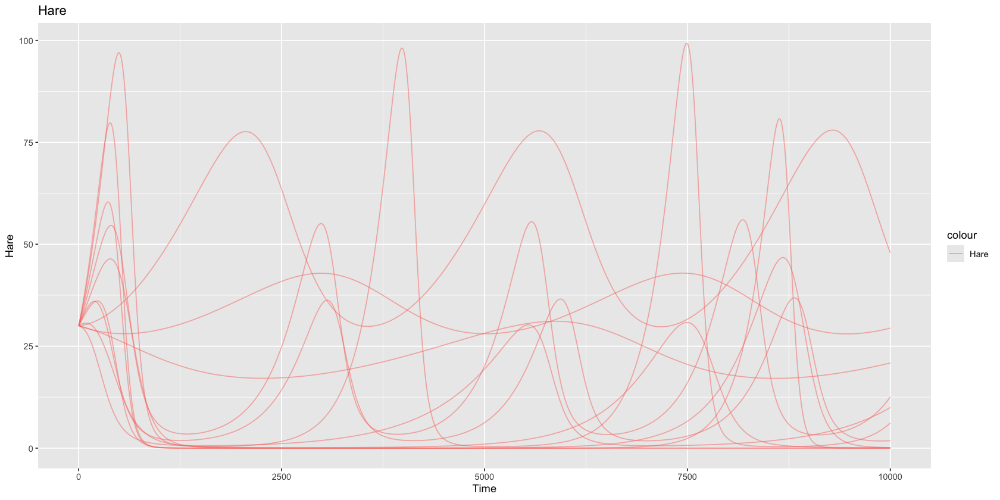

In [68]:
sim_lynx_hare <- function(n_steps, init, theta, dt = 0.002) {
    L <- rep(NA, n_steps)
    H <- rep(NA, n_steps)
    L[1] <- init[1]
    H[1] <- init[2]

    for (i in 2:n_steps) {
        H[i] <- H[i - 1] + dt * H[i - 1] * (theta[1] - theta[2] * L[i - 1])
        L[i] <- L[i - 1] + dt * L[i - 1] * (theta[3] * H[i - 1] - theta[4])
    }
    return(cbind(L, H))
}

N_sim <- 20

plot_df <- data.frame(year = numeric(), H = numeric(), L = numeric(), run = integer())
for (i in 1:N_sim) {
    b_h <- rnorm(1, 1, 0.5)
    m_h <- rnorm(1, 0.05, 0.05)
    b_l <- rnorm(1, 0.05, 0.05)
    m_l <- rnorm(1, 1, 0.5)
    if (b_h <= 0 || m_h <= 0 || b_l <= 0 || m_l <= 0) {
        next
    }
    theta <- c(b_h, m_h, b_l, m_l)
    pop_results <- sim_lynx_hare(1e4, as.numeric(Lynx_Hare[1, 2:3]), theta)
    sim_run <- data.frame(L = pop_results[, 1], H = pop_results[, 2])
    sim_run$year <- 1:nrow(sim_run)
    sim_run$run <- i
    plot_df <- rbind(plot_df, sim_run)
}
par(bg = 'white')
p_lynx <- ggplot() +
    geom_line(data = plot_df, mapping = aes(year, L, colour = "Lynx", group = run), alpha = 0.5) +
    labs(x = "Time", y = "Lynx", title = "Lynx")
p_hare <- ggplot() +
    geom_line(data = plot_df, mapping = aes(year, H, colour = "Hare", group = run), alpha = 0.5) +
    labs(x = "Time", y = "Hare", title = "Hare")

print(p_lynx)
print(p_hare)

There are a few things going wrong here. First, the lynx population seems to exhibit very little periodicity and have spikes to unreasonable population levels. Similarly, the hare population seems to also have unusually large spikes. On solution to that is to tighten up the variances for the priors:

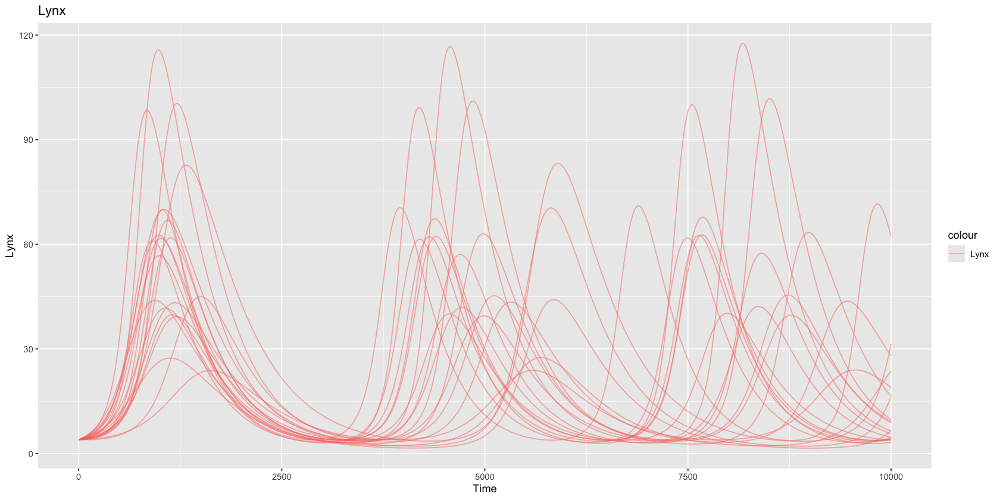

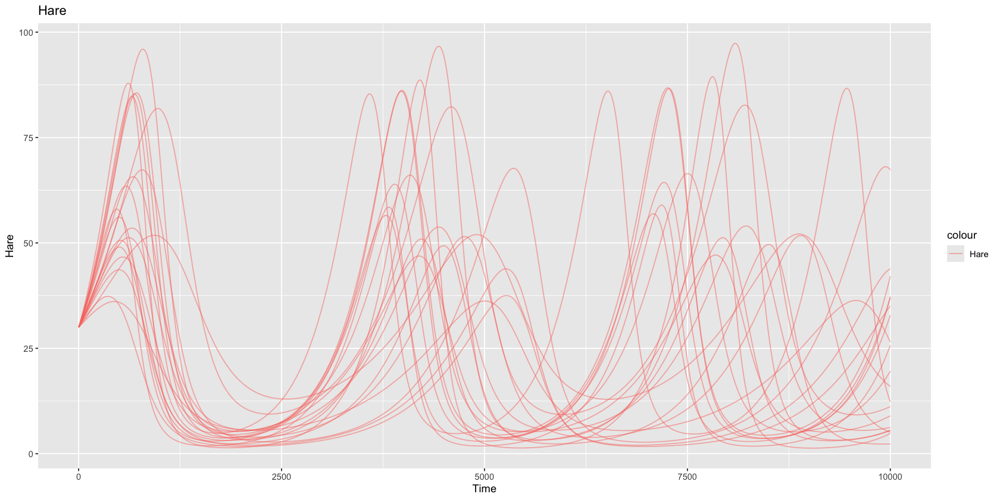

In [69]:
N_sim <- 20

plot_df <- data.frame(year = numeric(), H = numeric(), L = numeric(), run = integer())
for (i in 1:N_sim) {
    b_h <- rnorm(1, 1, 0.25)
    m_h <- rnorm(1, 0.05, 0.01)
    b_l <- rnorm(1, 0.05, 0.01)
    m_l <- rnorm(1, 1, 0.1)
    if (b_h <= 0 || m_h <= 0 || b_l <= 0 || m_l <= 0) {
        next
    }
    theta <- c(b_h, m_h, b_l, m_l)
    pop_results <- sim_lynx_hare(1e4, as.numeric(Lynx_Hare[1, 2:3]), theta)
    sim_run <- data.frame(L = pop_results[, 1], H = pop_results[, 2])
    sim_run$year <- 1:nrow(sim_run)
    sim_run$run <- i
    plot_df <- rbind(plot_df, sim_run)
}
par(bg = 'white')
p_lynx <- ggplot() +
    geom_line(data = plot_df, mapping = aes(year, L, colour = "Lynx", group = run), alpha = 0.5) +
    labs(x = "Time", y = "Lynx", title = "Lynx")
p_hare <- ggplot() +
    geom_line(data = plot_df, mapping = aes(year, H, colour = "Hare", group = run), alpha = 0.5) +
    labs(x = "Time", y = "Hare", title = "Hare")

print(p_lynx)
print(p_hare)

That definitely looks better! Now another problem - we are sometimes getting a larger population of hares than lynxes! I'm not sure what the correct ratio should be, but I'm fairly certaint that we don't want predators outnumbering prey. To fix that, I'm going to reduce the lynx birth rate.

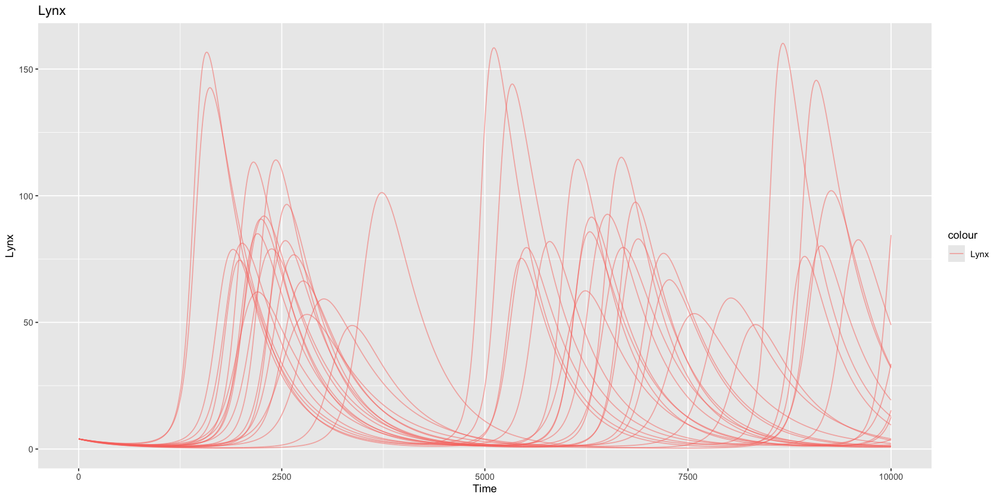

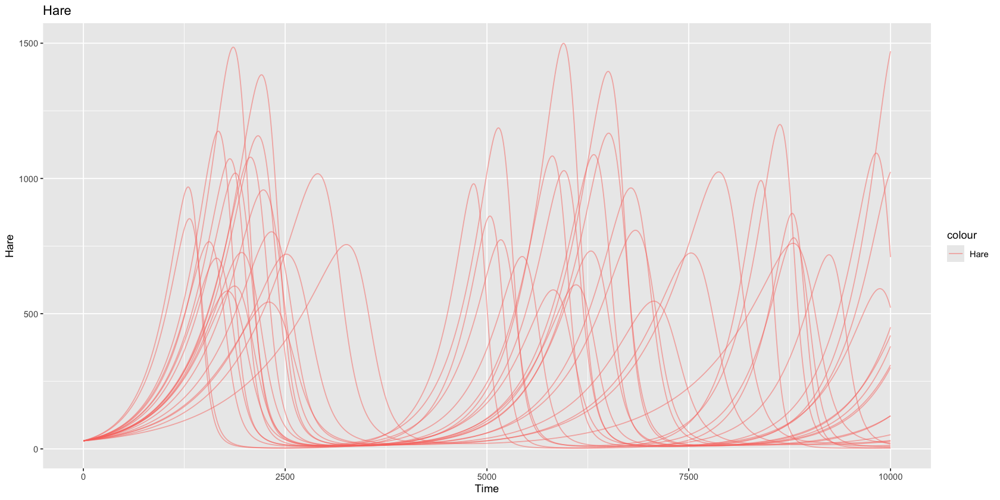

In [70]:
N_sim <- 20

plot_df <- data.frame(year = numeric(), H = numeric(), L = numeric(), run = integer())
for (i in 1:N_sim) {
    b_h <- rnorm(1, 1, 0.25)
    m_h <- rnorm(1, 0.05, 0.01)
    b_l <- rnorm(1, 0.005, 0.001)
    m_l <- rnorm(1, 1, 0.1)
    if (b_h <= 0 || m_h <= 0 || b_l <= 0 || m_l <= 0) {
        next
    }
    theta <- c(b_h, m_h, b_l, m_l)
    pop_results <- sim_lynx_hare(1e4, as.numeric(Lynx_Hare[1, 2:3]), theta)
    sim_run <- data.frame(L = pop_results[, 1], H = pop_results[, 2])
    sim_run$year <- 1:nrow(sim_run)
    sim_run$run <- i
    plot_df <- rbind(plot_df, sim_run)
}
par(bg = 'white')
p_lynx <- ggplot() +
    geom_line(data = plot_df, mapping = aes(year, L, colour = "Lynx", group = run), alpha = 0.5) +
    labs(x = "Time", y = "Lynx", title = "Lynx")
p_hare <- ggplot() +
    geom_line(data = plot_df, mapping = aes(year, H, colour = "Hare", group = run), alpha = 0.5) +
    labs(x = "Time", y = "Hare", title = "Hare")

print(p_lynx)
print(p_hare)

That seems more reasonable to me. TBH, even having ten times as many hares as lynxes seems low - if we ballpark a figure of a lynx eating a hare a day, it seems like we want at minimum 365 times as many hares as lynxes, so what we have above (10x) seems low, but it's much better!

**16M4** Modify the cylinder height model to use a sphere instead of a cylinder. What choices o you now have to make? Is this a better model, on a predictive basis? Why or why not?

**Answer** We now need to use one dimension (the radius of the sphere) instead of two (the height and radius of the cylinder). The reasonable choice here would be half the height, but I'd like to make this a strong prior rather than hard-coding it.

$$
V = \frac{4}{3} * \pi * r^3
$$

We'll assume that the 'radius' is some proportion $\rho$ of the height (strong prior on 0.5):

$$
V = \frac{4}{3} * \pi * ( \rho * h )^3 = \frac{4}{3} * \pi * \rho^3 * h^3
$$

And as before, we'll assume that there's a constant of proportionality $k$ translating this to mass:

$$
M = k * V = \frac{4}{3} * \pi * \rho^3 h^3
$$

In [71]:
data(Howell1)
d <- Howell1

d$w <- d$weight / mean(d$weight)
d$h <- d$height / mean(d$height)

m16.1 <- ulam(
    alist(
        w ~ dlnorm(mu, sigma),
        exp(mu) <- 3.141593 * k * p^2 * h^3,
        p ~ beta(2, 18),
        k ~ exponential(0.5),
        sigma ~ exponential(1)
    ),
    data = d,
    chains = 4,
    cores = 4
)
m16m4 <- ulam(
    alist(
        w ~ dlnorm(mu, sigma),
        exp(mu) <- (1.33333333333) * 3.141593 * k * p^3 * h^3,
        p ~ beta(20, 20),
        k ~ exponential(0.5),
        sigma ~ exponential(1)
    ),
    data = d,
    chains = 4,
    cores = 4
)

Running MCMC with 4 parallel chains, with 1 thread(s) per chain...

Chain 1 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45eeb638.stan', line 23, column 4 to column 32)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 



Chain 2 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45eeb638.stan', line 23, column 4 to column 32)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45eeb638.stan', line 23, column 4 to column 32)

Chain 2 If this warning occurs sporadically, such as for highly constraine

Chain 3 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45eeb638.stan', line 23, column 4 to column 32)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45eeb638.stan', line 23, column 4 to column 32)

Chain 3 If this warning occurs sporadically, such as for highly constraine

Chain 4 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45eeb638.stan', line 23, column 4 to column 32)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 



Chain 1 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 2 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 3 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 4 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 1 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 2 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 3 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 4 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 3 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 2 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 1 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 4 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 3 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 2 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 4 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 1 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 3 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 3 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 4 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 4 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 1 Iteration: 500 / 1000 [ 50%]

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b5c30bda4.stan', line 23, column 4 to column 32)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 



Chain 2 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b5c30bda4.stan', line 23, column 4 to column 32)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 



Chain 3 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b5c30bda4.stan', line 23, column 4 to column 32)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b5c30bda4.stan', line 23, column 4 to column 32)

Chain 3 If this warning occurs sporadically, such as for highly constraine

Chain 4 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter[1] is -inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b5c30bda4.stan', line 23, column 4 to column 32)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter[1] is -inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b5c30bda4.stan', line 23, column 4 to column 32)

Chain 4 If this warning occurs sporadically, such as for highly constrai

Chain 1 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 3 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 4 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 2 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 4 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 1 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 2 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 3 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 1 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 4 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 1 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 2 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 3 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 4 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 1 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 1 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 2 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 3 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 4 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 4 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 1 Iteration: 600 / 1000 [ 60%]

              [,1]       [,2]       [,3]       [,4]       [,5]       [,6]
   [1,] 0.06072187 0.06374731 0.10023122 0.10486912 0.10846634 0.13988272
   [2,] 0.03084583 0.06884000 0.10258122 0.08348517 0.18432373 0.15764215
   [3,] 0.05419928 0.08803636 0.09527424 0.12083415 0.13364022 0.13309333
   [4,] 0.05423213 0.08441881 0.12687521 0.10899671 0.19753579 0.08766011
   [5,] 0.04586112 0.07453205 0.09212740 0.11720900 0.12494608 0.16634174
   [6,] 0.03411033 0.07960811 0.08064757 0.09043546 0.13791911 0.22221000
   [7,] 0.05668547 0.06019435 0.07082313 0.07005025 0.10630603 0.17320948
   [8,] 0.06094631 0.07397772 0.06037219 0.12044381 0.12460310 0.12401527
   [9,] 0.04325506 0.06016406 0.09532649 0.12674746 0.10599245 0.14781100
  [10,] 0.05904016 0.06474115 0.13470599 0.12399539 0.14009973 0.12457804
  [11,] 0.04119369 0.06773307 0.04929263 0.15433279 0.14941390 0.18305449
  [12,] 0.07282315 0.05361372 0.07570237 0.10502152 0.19857180 0.18141527
  [13,] 0.06828697 0.06696348 0.080111

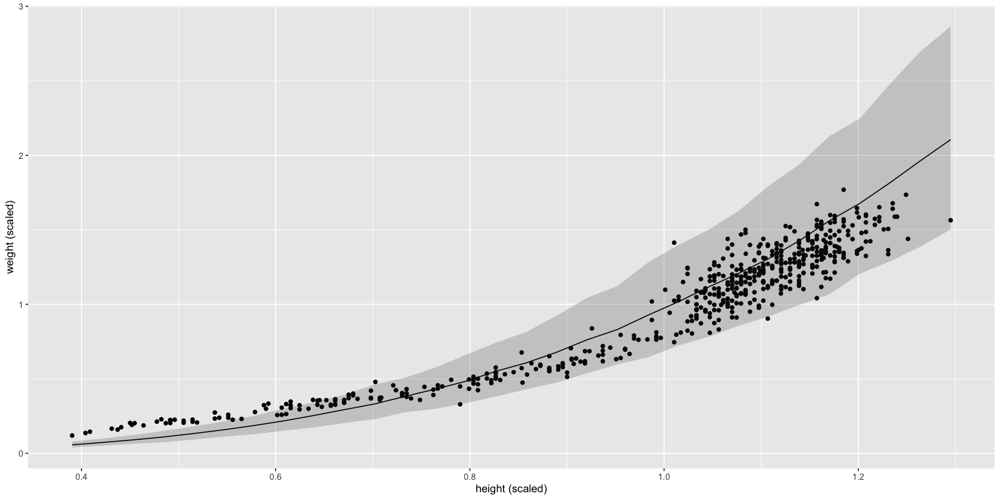

In [72]:
h_seq <- seq(from = min(d$h), to = max(d$h), length.out = 30)
w_sim <- sim(m16m4, data = list(h = h_seq))
print(w_sim)
mu_mean <- apply(w_sim, 2, mean)
w_CI <- apply(w_sim, 2, PI)

# w_CI
sim_df <- data.frame(
    h = h_seq,
    mean = mu_mean,
    lower = w_CI[1, ],
    upper = w_CI[2, ]
)

ggplot() +
    geom_point(data = d, mapping = aes(h, w)) +
    geom_line(data = sim_df, mapping = aes(h, mean)) +
    geom_ribbon(data = sim_df, mapping = aes(h, ymin = lower, ymax = upper), alpha = 0.2) +
    labs(x = 'height (scaled)', y = 'weight (scaled)')

These results seem to be basically on par with those of `m16.1`. To determine which does a better predictive job, let's compare the models by adding the log likelhood.

In [73]:
m16.1 <- ulam(
    alist(
        w ~ dlnorm(mu, sigma),
        exp(mu) <- 3.141593 * k * p^2 * h^3,
        p ~ beta(2, 18),
        k ~ exponential(0.5),
        sigma ~ exponential(1)
    ),
    data = d,
    chains = 4,
    cores = 4,
    log_lik = TRUE
)
m16m4 <- ulam(
    alist(
        w ~ dlnorm(mu, sigma),
        exp(mu) <- (1.33333333333) * 3.141593 * k * p^3 * h^3,
        p ~ beta(20, 20),
        k ~ exponential(0.5),
        sigma ~ exponential(1)
    ),
    data = d,
    chains = 4,
    cores = 4,
    log_lik = TRUE
)
compare(m16.1, m16m4)

Running MCMC with 4 parallel chains, with 1 thread(s) per chain...

Chain 1 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b1b3d7fac.stan', line 23, column 4 to column 32)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b1b3d7fac.stan', line 23, column 4 to column 32)

Chain 1 If this warning occurs sporadically, such as for highly constraine

Chain 2 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b1b3d7fac.stan', line 23, column 4 to column 32)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 



Chain 3 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b1b3d7fac.stan', line 23, column 4 to column 32)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 



Chain 4 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b1b3d7fac.stan', line 23, column 4 to column 32)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 



Chain 1 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 2 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 4 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 3 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 1 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 2 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 3 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 4 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 1 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 3 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 2 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 4 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 1 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 2 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 3 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 4 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 1 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 1 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 3 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 3 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 2 Iteration: 500 / 1000 [ 50%]

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is -inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b6d81d2e.stan', line 23, column 4 to column 32)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 



Chain 2 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Scale parameter is inf, but must be positive finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b6d81d2e.stan', line 23, column 4 to column 32)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Scale parameter is inf, but must be positive finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b6d81d2e.stan', line 23, column 4 to column 32)

Chain 2 If this warning occurs sporadically, such as for highly constr

Chain 3 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b6d81d2e.stan', line 23, column 4 to column 32)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 



Chain 4 Iteration:   1 / 1000 [  0%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Scale parameter is inf, but must be positive finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b6d81d2e.stan', line 23, column 4 to column 32)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Scale parameter is inf, but must be positive finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b6d81d2e.stan', line 23, column 4 to column 32)

Chain 4 If this warning occurs sporadically, such as for highly constr

Chain 1 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 2 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 4 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 3 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 4 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 2 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 3 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 1 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 3 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 4 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 2 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 1 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 3 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 2 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 4 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 1 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 2 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 2 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 4 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 4 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 3 Iteration: 500 / 1000 [ 50%]

,WAIC,SE,dWAIC,dSE,pWAIC,weight
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
m16m4,-310.7807,44.17236,0.0000000,NA,3.453423,0.5449375
m16.1,-310.4202,44.30836,0.3604726,0.161531,3.775371,0.4550625


From this, it seems like the models do basically the same job predictively. This is not terribly surprising, since we can write one to look the same oas the other, just with different parameterizations.

**16H1** Modify the Panda nut opening model so that male and female chimpanzees have different maximum adult body masses. The `sex` variable in `data(Panda_nuts)` provides the information you need. Be sure to incorporate the face that you know, prior to seeing the data, that males are on average larger than femlaes at maturity.

In [74]:
data(Panda_nuts)
head(Panda_nuts)

,chimpanzee,age,sex,hammer,nuts_opened,seconds,help
,<int>,<int>,<fct>,<fct>,<int>,<dbl>,<fct>
1,11,3,m,G,0,61,N
2,11,3,m,G,0,37,N
3,18,4,f,wood,0,20,N
4,18,4,f,G,0,14,y
5,18,4,f,L,0,13,N
6,11,4,m,Q,0,24,N


We need to slightly modify the model. We have 
$$
\begin{align*}
\lambda &= \alpha S_t^{\theta} \\
        &= \alpha \left( \beta M_{\text{max}} (1 - e^{-kt}) \right)^\theta
\end{align*}
$$

We rescaled so that the max mass was 1. *HOWEVER*, I'm going to change this so that we keep the max mass in and have it be a parameter differing for males and females, with priors of 1 (for males) and 0.9 (for females). I'm guessing that female chimps are about 90% the mass of the males.

$$
\lambda = M_{\text{max, sex}}\alpha \beta^\theta \left( 1 - e^{-kt}  \right)^\theta
$$

The product $\alpha \beta^\theta$ just re-scales strength to nuts opened per second, so we can replace it with a single parameter $\phi$:

$$
\lambda = M_{\text{max, sex}}\phi (1 - e^{-kt})^\theta
$$

In [75]:
# now just build the model
dat_list <- list(
    n = as.integer(Panda_nuts$nuts_opened),
    age = Panda_nuts$age / max(Panda_nuts$age),
    seconds = Panda_nuts$seconds,
    sex = ifelse(Panda_nuts$sex == "m", 1, 2)
)

m16h1 <- ulam(
    alist(
        n ~ poisson(lambda),
        lambda <- m_max[sex] * seconds * phi * (1 - exp(-k * age)) ^ theta,
        vector[2]: m_max ~ normal(1, 0.1),
        male_prior ~ normal(1, 0.1),
        female_prior ~ normal(0.9, 0.1),
        phi ~ lognormal(log(1), 0.1),
        k ~ lognormal(log(2), 0.25),
        theta ~ lognormal(log(5), 0.25)
    ),
    data = dat_list,
    chains = 4
)

Running MCMC with 4 sequential chains, with 1 thread(s) per chain...



Chain 1 Rejecting initial value:

Chain 1   Error evaluating the log probability at the initial value.

Chain 1 Exception: poisson_lpmf: Rate parameter[1] is -8.64837, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 1 Exception: poisson_lpmf: Rate parameter[1] is -8.64837, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 1 Rejecting initial value:

Chain 1   Error evaluating the log probability at the initial value.

Chain 1 Exception: poisson_lpmf: Rate parameter[1] is -552.037, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 1 Exception: poisson_lpmf: Rate parameter[1] is -552.037, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX

Chain 1 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 1 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 1 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 1 Iteration: 300 / 1000 [ 30%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: poisson_lpmf: Rate parameter[3] is -2.44892e+155, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: poisson_lpmf: Rate parameter[3] is -5.47604e+156, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 1 If this warning occurs sporadically, such as for

Chain 1 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 1 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 1 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 1 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 1 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 1 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 1 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 1 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 1 finished in 0.4 seconds.


Chain 2 Rejecting initial value:

Chain 2   Error evaluating the log probability at the initial value.

Chain 2 Exception: poisson_lpmf: Rate parameter[1] is -5.7217, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 2 Exception: poisson_lpmf: Rate parameter[1] is -5.7217, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 2 Rejecting initial value:

Chain 2   Error evaluating the log probability at the initial value.

Chain 2 Exception: poisson_lpmf: Rate parameter[1] is -0.289315, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 2 Exception: poisson_lpmf: Rate parameter[1] is -0.289315, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX

Chain 2 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 2 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 2 Iteration: 200 / 1000 [ 20%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: poisson_lpmf: Rate parameter[1] is -9.59611e-09, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 



Chain 2 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 2 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 2 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 2 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 2 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 2 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 2 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 2 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 2 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 2 finished in 0.4 seconds.
Chain 3 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 3 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 3 Iteration: 200 / 1000 [ 20%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: poisson_lpmf: Rate parameter[3] is -7.44874e-23, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: poisson_lpmf: Rate parameter[3] is -0.278241, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 3 If this warning occurs sporadically, such as for high

Chain 3 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 3 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 3 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 3 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 3 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 3 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 3 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 3 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 3 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 3 finished in 0.3 seconds.


Chain 4 Rejecting initial value:

Chain 4   Error evaluating the log probability at the initial value.

Chain 4 Exception: poisson_lpmf: Rate parameter[1] is -2.54067e-08, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 4 Exception: poisson_lpmf: Rate parameter[1] is -2.54067e-08, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 4 Rejecting initial value:

Chain 4   Error evaluating the log probability at the initial value.

Chain 4 Exception: poisson_lpmf: Rate parameter[3] is -0.188017, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 4 Exception: poisson_lpmf: Rate parameter[3] is -0.188017, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/

Chain 4 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 4 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 4 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 4 Iteration: 300 / 1000 [ 30%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: poisson_lpmf: Rate parameter[1] is -1.55609e-47, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: poisson_lpmf: Rate parameter[1] is -0.000210691, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b2682171a.stan', line 26, column 4 to column 26)

Chain 4 If this warning occurs sporadically, such as for h

Chain 4 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 4 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 4 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 4 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 4 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 4 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 4 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 4 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 4 finished in 0.3 seconds.

All 4 chains finished successfully.
Mean chain execution time: 0.3 seconds.
Total execution time: 1.6 seconds.



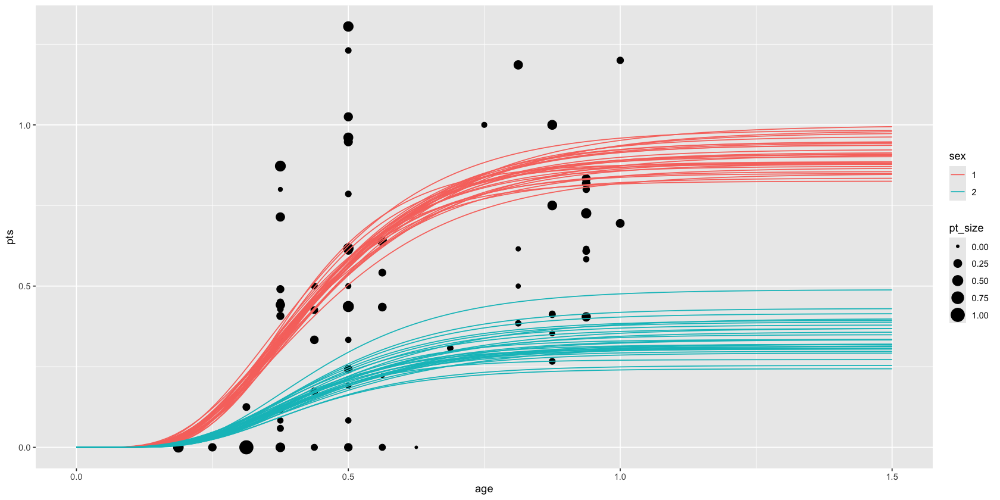

In [76]:
post <- extract.samples(m16h1)
age <- seq(from = 0, to = 1.5, length.out = 100)
pts <- dat_list$n / dat_list$seconds
point_size <- normalize(dat_list$seconds)
points_data <- data.frame(age = dat_list$age, pts = pts, pt_size = point_size)

curve_data <- data.frame(age = numeric(), rate = numeric(), run = integer(), sex = integer())
for (sex in c(1, 2)) {
    for (i in 1:30) {
        curve <- post$phi[i] * post$m_max[i, sex] * (1 - exp(-post$k[i] * age)) ^ post$theta[i]
        run_df <- data.frame(age = age, rate = curve, run = 100 * sex + i, sex = sex)
        curve_data <- rbind(curve_data, run_df)
    }
}
curve_data$sex <- as.factor(curve_data$sex)
ggplot() +
    geom_point(data = points_data, mapping = aes(age, pts, size = pt_size)) +
    geom_line(data = curve_data, mapping = aes(age, rate, group = run, colour = sex))

Unfortunately, I wasn't able to get the priors to be different for the male and female chimpanzees within ulam. I am reasonably sure that I could do it by switching the entire model over to [[Stan]], but this seems to have worked out just fine anyway.

**16H2** Now return to the Panda nut model and try to incorporate individual difference there are two parameters, $\phi$ and $k$, which plausibly vary by individual. Pick one of these and allow it to vary by individual and use partial pooling to avoid overfitting. The variable `chimpanzee` in `data(Panda_nuts)` tells you which oberservation belongs to which individual.

**Answer** The parameter $\phi$ has something to do with relating strength to nuts opened per second, so let's allow that one to vary. First I'll build the model without partial pooling:

In [77]:
dat_list <- list(
    n = as.integer(Panda_nuts$nuts_opened),
    age = Panda_nuts$age / max(Panda_nuts$age),
    seconds = Panda_nuts$seconds,
    chimpanzee = Panda_nuts$chimpanzee
)

m16h2.unpooled <- ulam(
    alist(
        n ~ poisson(lambda),
        lambda <- seconds * phi[chimpanzee] * (1 - exp(-k * age)) ^ theta,
        phi[chimpanzee] ~ lognormal(log(1), 0.1),
        k ~ lognormal(log(2), 0.25),
        theta ~ lognormal(log(5), 0.25)
    ),
    data = dat_list,
    chains = 4
)

Running MCMC with 4 sequential chains, with 1 thread(s) per chain...

Chain 1 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 1 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 1 Iteration: 200 / 1000 [ 20%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: poisson_lpmf: Rate parameter[1] is nan, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b458811df.stan', line 20, column 4 to column 26)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 



Chain 1 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 1 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 1 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 1 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 1 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 1 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 1 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 1 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 1 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 1 finished in 0.3 seconds.
Chain 2 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 2 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 2 Iteration: 200 / 1000 [ 20%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: poisson_lpmf: Rate parameter[9] is nan, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b458811df.stan', line 20, column 4 to column 26)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 



Chain 2 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 2 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 2 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 2 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 2 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 2 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 2 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 2 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 2 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 2 finished in 0.4 seconds.
Chain 3 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 3 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 3 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 3 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 3 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 3 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 3 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 3 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 3 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 3 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 3 Iteration: 900 / 1000 [ 90

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: poisson_lpmf: Rate parameter[9] is nan, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b458811df.stan', line 20, column 4 to column 26)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 



Chain 4 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 4 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 4 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 4 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 4 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 4 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 4 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 4 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 4 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 4 finished in 0.4 seconds.

All 4 chains finished successfully.
Mean chain execution time: 0.4 seconds.
Total execution time: 1.8 seconds.



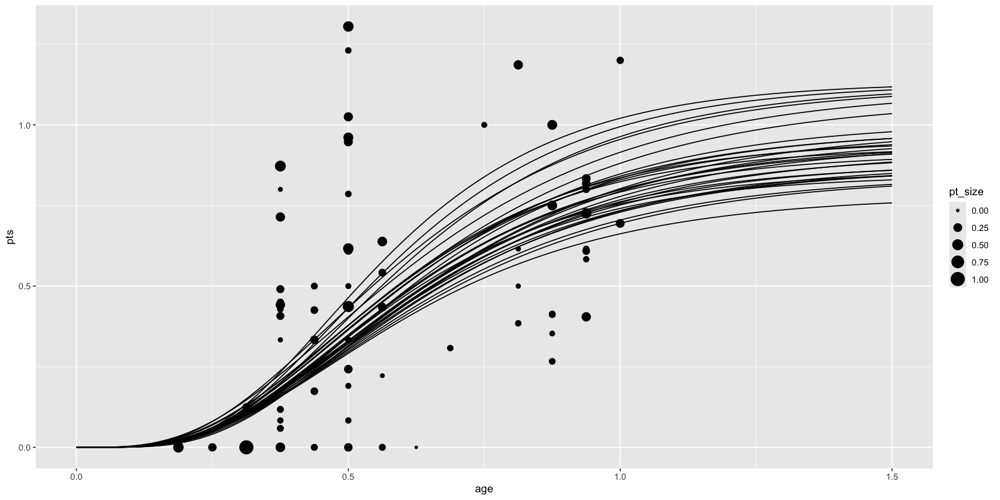

In [78]:
post <- extract.samples(m16h2.unpooled)
age <- seq(from = 0, to = 1.5, length.out = 100)
pts <- dat_list$n / dat_list$seconds
point_size <- normalize(dat_list$seconds)
points_data <- data.frame(age = dat_list$age, pts = pts, pt_size = point_size)

curve_data <- data.frame(age = numeric(), rate = numeric(), run = integer(), sex = integer())
for (i in 1:30) {
    curve <- post$phi[i] * (1 - exp(-post$k[i] * age)) ^ post$theta[i]
    run_df <- data.frame(age = age, rate = curve, run = i, sex = sex)
    curve_data <- rbind(curve_data, run_df)
}
curve_data$sex <- as.factor(curve_data$sex)
ggplot() +
    geom_point(data = points_data, mapping = aes(age, pts, size = pt_size)) +
    geom_line(data = curve_data, mapping = aes(age, rate, group = run))

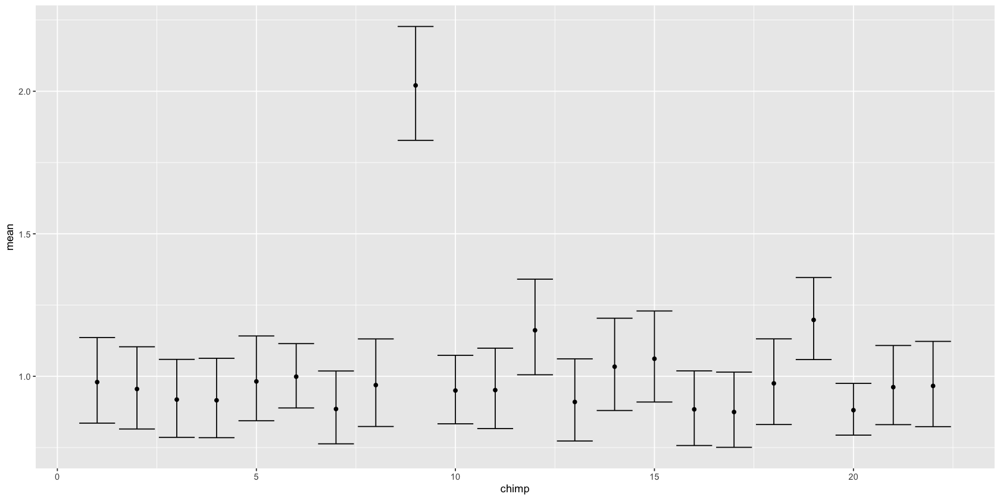

In [79]:
phi_means <- apply(post$phi, 2, mean)
phi_lower_upper <- apply(post$phi, 2, PI)
phi_data <- data.frame(mean = phi_means, lower = phi_lower_upper[1, ], upper = phi_lower_upper[2, ])
phi_data$chimp <- 1:nrow(phi_data)

ggplot(phi_data, aes(chimp)) +
    geom_point(aes(y = mean)) +
    geom_errorbar(aes(ymin = lower, ymax = upper))

Now let's do the partial pooling by allowing $\phi$ to vary by individual, but sharing a common, linked prior:

In [80]:
m16h2.pooled <- ulam(
    alist(
        n ~ poisson(lambda),
        lambda <- seconds * phi[chimpanzee] * (1 - exp(-k * age)) ^ theta,
        phi[chimpanzee] ~ lognormal(phi_mean, 0.1),
        phi_mean ~ normal(0, 1),
        k ~ lognormal(log(2), 0.25),
        theta ~ lognormal(log(5), 0.25)
    ),
    data = dat_list,
    chains = 4
)

Running MCMC with 4 sequential chains, with 1 thread(s) per chain...

Chain 1 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 1 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 1 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 1 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 1 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 1 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 1 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 1 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 1 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 1 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 1 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 1 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 1 finished in 0.5 seconds.
Chain 2 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 2 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 2 Iteration: 200 / 1000 [ 20%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: poisson_lpmf: Rate parameter[3] is nan, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b4641ab1a.stan', line 22, column 4 to column 26)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 



Chain 2 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 2 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 2 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 2 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 2 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 2 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 2 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 2 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 2 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 2 finished in 0.4 seconds.
Chain 3 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 3 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 3 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 3 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 3 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 3 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 3 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 3 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 3 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 3 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 3 Iteration: 900 / 1000 [ 90

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: poisson_lpmf: Rate parameter[9] is nan, but must be nonnegative! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b4641ab1a.stan', line 22, column 4 to column 26)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 



Chain 4 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 4 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 4 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 4 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 4 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 4 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 4 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 4 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 4 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 4 finished in 0.4 seconds.

All 4 chains finished successfully.
Mean chain execution time: 0.4 seconds.
Total execution time: 1.9 seconds.



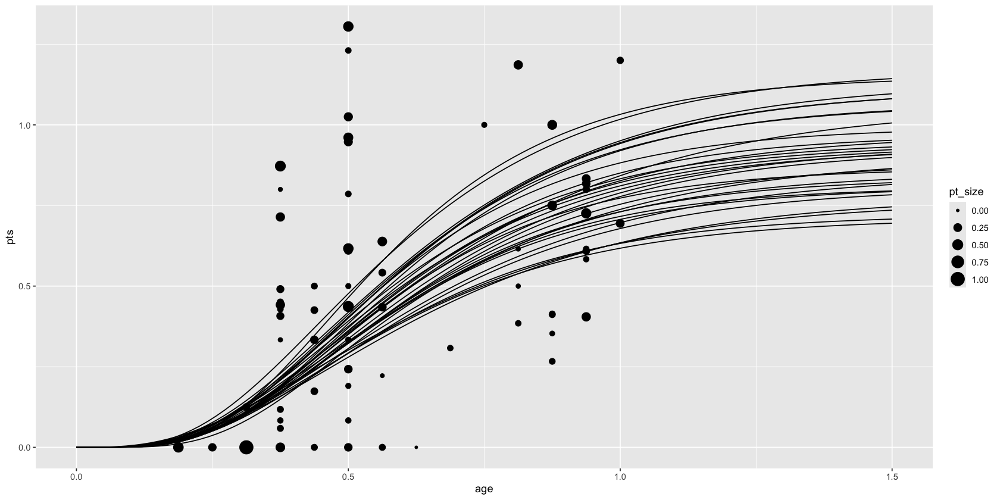

In [81]:
post <- extract.samples(m16h2.pooled)
age <- seq(from = 0, to = 1.5, length.out = 100)
pts <- dat_list$n / dat_list$seconds
point_size <- normalize(dat_list$seconds)
points_data <- data.frame(age = dat_list$age, pts = pts, pt_size = point_size)

curve_data <- data.frame(age = numeric(), rate = numeric(), run = integer(), sex = integer())
for (i in 1:30) {
    curve <- post$phi[i] * (1 - exp(-post$k[i] * age)) ^ post$theta[i]
    run_df <- data.frame(age = age, rate = curve, run = i, sex = sex)
    curve_data <- rbind(curve_data, run_df)
}
curve_data$sex <- as.factor(curve_data$sex)
ggplot() +
    geom_point(data = points_data, mapping = aes(age, pts, size = pt_size)) +
    geom_line(data = curve_data, mapping = aes(age, rate, group = run))

post_unpooled <- post

In [82]:
head(post$phi)

0.850056,0.968667,0.837394,1.007290,0.909202,0.947477,0.766940,0.944816,2.08437,1.022320,⋯,0.800459,1.028450,0.995234,0.921503,0.843523,0.876778,1.27145,0.879870,1.062620,0.945704
0.903497,0.938433,0.898274,0.946819,0.917755,0.961602,0.830257,1.019130,2.03697,0.965429,⋯,0.813572,1.138980,0.895702,0.906368,0.925643,0.953533,1.24303,0.999077,1.074510,0.909672
1.060550,0.905858,0.780145,0.775109,0.870660,0.983817,0.939247,0.869606,2.09441,0.868750,⋯,1.065520,1.012230,0.949381,0.790142,0.818059,0.780185,1.22901,0.877763,0.803853,0.978136
0.767326,0.896084,0.901628,0.769414,0.930861,0.874403,0.883292,1.020650,1.90670,0.925432,⋯,0.967170,0.868844,0.956467,0.930669,0.798269,0.897781,1.17049,0.970418,0.807944,0.888340
0.780241,0.991194,0.956573,0.831556,0.973438,0.851189,0.807799,1.005060,1.88702,0.905549,⋯,0.893997,0.906142,0.902166,0.905158,0.865061,0.808687,1.26156,0.959800,0.774016,0.941205
0.884460,0.913310,0.889604,0.852321,0.879749,1.174020,0.879894,0.898145,2.05404,1.038160,⋯,0.840989,0.991777,1.073160,0.834093,0.810733,0.933402,1.04194,0.883883,0.845734,0.789912


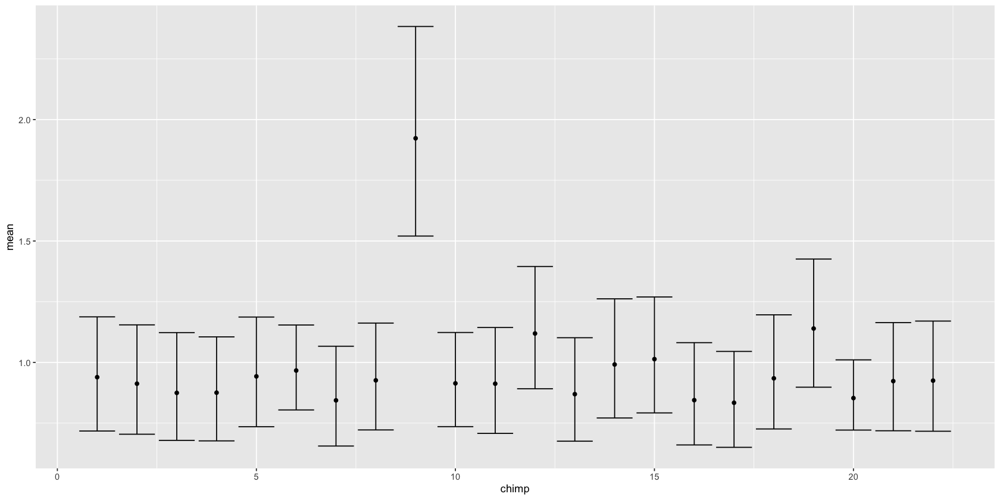

In [83]:
phi_means <- apply(post$phi, 2, mean)
phi_lower_upper <- apply(post$phi, 2, PI)
phi_data <- data.frame(mean = phi_means, lower = phi_lower_upper[1, ], upper = phi_lower_upper[2, ])
phi_data$chimp <- 1:nrow(phi_data)

ggplot(phi_data, aes(chimp)) +
    geom_point(aes(y = mean)) +
    geom_errorbar(aes(ymin = lower, ymax = upper))

Interesting! It looks like these are basically all the same between the chimps, with the exception of one outlier.

**16H3** The chapter asserts that a typical geocentric time series model might be one that uses lag variables. Here you'll fit such a model and compare it to the ODE mode in the chapter. an autoregressive time series uses earlier values of the state variables to predict new values of the same variables. These earlier values are called *lag variables*. You can construct the lag variables here with

In [84]:
data(Lynx_Hare)
data_ar1 <- list(
    L = Lynx_Hare$Lynx[2:21],
    L_lag1 = Lynx_Hare$Lynx[1:20],
    H = Lynx_Hare$Hare[2:21],
    H_lag1 = Lynx_Hare$Hare[1:20]
)

Now we can use `L_lag1` and `H_lag1` as predictors of the outcomes `L` and `H`, like this:

$$
\begin{align*}
L_t &\sim \text{Log-Normal}(\log \mu_{L, t}, \sigma_L) \\
\mu_{L, t} &= \alpha_L + \beta_{LL}L_{t - 1} + \beta_{LH} H_{t - 1} \\
H_t &\sim \text{Log-Normal}(\log \mu_{H, t}, \sigma_H) \\
\mu_{H, t} &= \alpha_H + \beta_{HH}H_{t - 1} + \beta_{HL}L_{t - 1}
\end{align*}
$$

Where $L_{t-1}$ and $H_{t-1}$ are the lag variables. Use `ulam()` to fit this model. Be careful of the priors of the $\alpha$ and $\beta$ parameters. Compare the posterior predictions of the autoregressive model to the ODE model in the chapter. How do the predictions differ? Can you explain why, using the structure of the models?

In [85]:
m16h3.1 <- ulam(
    alist(
        L ~ lognormal(log(mu_l), sigma_l),
        mu_l <- a_l + b_ll * L_lag1 + b_lh * H_lag1,
        H ~ lognormal(log(mu_h), sigma_h),
        mu_h <- a_h + b_hh * H_lag1 + b_hl * L_lag1,
        # priors
        a_l ~ normal(0, 1),
        a_h ~ normal(0, 1),
        sigma_l ~ exponential(1),
        sigma_h ~ exponential(1),
        b_ll ~ normal(0, 1),
        b_lh ~ normal(0, 1),
        b_hh ~ normal(0, 1),
        b_hl ~ normal(0, 1)
    ),
    data = data_ar1,
    chains = 4,
    cores = 4
)

Running MCMC with 4 parallel chains, with 1 thread(s) per chain...



Chain 1 Rejecting initial value:

Chain 1   Error evaluating the log probability at the initial value.

Chain 1 Exception: lognormal_lpdf: Location parameter[5] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45c1f5ad.stan', line 31, column 4 to column 41)

Chain 1 Exception: lognormal_lpdf: Location parameter[5] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45c1f5ad.stan', line 31, column 4 to column 41)

Chain 1 Rejecting initial value:

Chain 1   Error evaluating the log probability at the initial value.

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45c1f5ad.stan', line 31, column 4 to column 41)

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45c1f

Chain 1 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 1 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 1 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 1 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 1 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 1 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 1 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 1 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 1 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 1 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 1 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 1 Iteration: 1000 / 1000 [100%]  (Sampling) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45c1f5ad.stan', line 31, column 4 to column 41)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45c1f5ad.stan', line 31, column 4 to column 41)

Chain 1 If this warning occurs sporadically, such as for highly constraine

Chain 2 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 2 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 2 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 2 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 2 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 2 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 2 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 2 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 2 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 2 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 2 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 2 Iteration: 1000 / 1000 [100%]  (Sampling) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45c1f5ad.stan', line 31, column 4 to column 41)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45c1f5ad.stan', line 35, column 4 to column 41)

Chain 2 If this warning occurs sporadically, such as for highly constraine

Chain 3 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 3 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 3 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 3 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 3 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 3 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 3 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 3 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 3 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 3 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 3 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 3 Iteration: 1000 / 1000 [100%]  (Sampling) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45c1f5ad.stan', line 35, column 4 to column 41)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45c1f5ad.stan', line 35, column 4 to column 41)

Chain 3 If this warning occurs sporadically, such as for highly constraine

Chain 4 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 4 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 4 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 4 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 4 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 4 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 4 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 4 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 4 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 4 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 4 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 4 Iteration: 1000 / 1000 [100%]  (Sampling) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45c1f5ad.stan', line 31, column 4 to column 41)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b45c1f5ad.stan', line 31, column 4 to column 41)

Chain 4 If this warning occurs sporadically, such as for highly constraine

Chain 1 finished in 0.1 seconds.
Chain 2 finished in 0.1 seconds.
Chain 3 finished in 0.1 seconds.
Chain 4 finished in 0.1 seconds.

All 4 chains finished successfully.
Mean chain execution time: 0.1 seconds.
Total execution time: 0.6 seconds.



,mean,sd,5.5%,94.5%,rhat,ess_bulk
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
a_l,-0.7872905,0.91264464,-2.2244909,0.67291272,1.000709,1991.751
a_h,0.7326345,0.99010693,-0.8597562,2.28106095,1.003998,1788.518
sigma_l,0.3088340,0.05711134,0.2327525,0.40454670,1.002280,1692.913
sigma_h,0.4536532,0.08567142,0.3385764,0.60931545,1.003748,1638.724
b_ll,0.5282177,0.08691850,0.3938448,0.66708196,1.001320,1518.379
b_lh,0.2508850,0.04759333,0.1722989,0.32925603,1.000295,1518.288
b_hh,1.1083418,0.16023608,0.8642647,1.36944155,1.001118,1096.673
b_hl,-0.1460264,0.11833987,-0.3231361,0.05542695,1.002295,1163.532


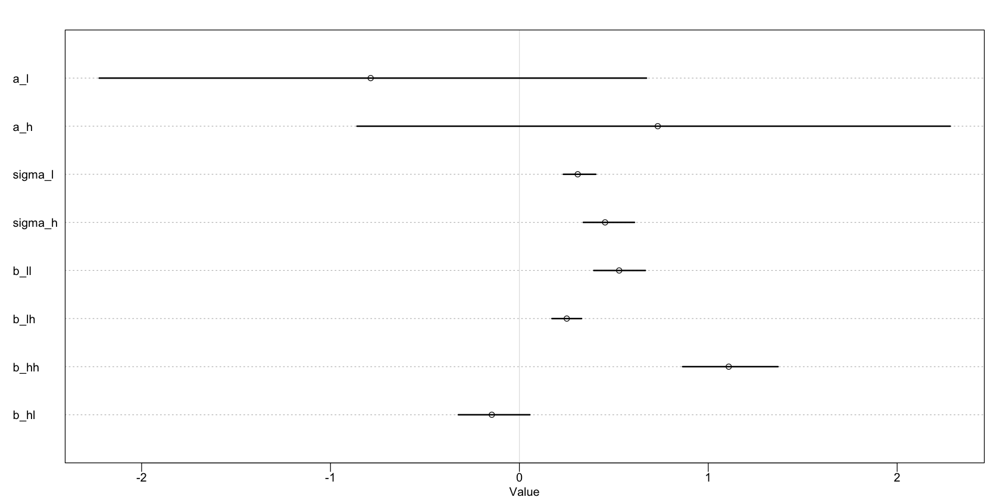

In [86]:
precis(m16h3.1)
par(bg = 'white')
plot(precis(m16h3.1))

In [87]:
means <- link(m16h3.1)
head(means)

7.073530,11.07816,17.00694,34.45835,43.68598,29.87683,14.88754,11.536683,8.605601,9.644820,8.813437,11.23594,16.57876,24.23464,37.34086,35.75442,20.70663,11.208930,8.364584,8.868765
8.356472,11.73538,16.76440,32.22044,40.87778,28.75551,15.44030,12.422030,9.806551,10.694874,9.936495,11.95031,16.52576,23.12880,35.05716,33.99913,20.69445,12.279261,9.671900,10.103408
8.718436,12.15191,17.24924,32.60028,40.97488,28.88511,15.67873,12.704311,10.115623,11.012725,10.269686,12.33065,16.94729,23.58745,35.28664,34.07552,20.85080,12.494378,9.945486,10.381003
10.389810,17.93871,28.50969,44.77111,42.34379,27.02037,13.95773,11.985023,9.698030,11.395897,11.122811,16.37565,24.91317,36.08375,41.00244,31.63172,17.09646,8.324597,7.680989,8.492557
7.913700,13.73295,21.97985,37.21010,38.54989,25.00296,12.47222,10.247864,7.960319,9.311457,8.891308,12.82941,19.65924,28.79861,35.79562,29.60552,16.16026,7.919008,6.658579,7.306686
8.740132,14.91569,23.66946,39.88522,41.37018,26.95969,13.61332,11.238929,8.801007,10.235705,9.785710,13.96275,21.21564,30.92500,38.41345,31.86465,17.55211,8.777172,7.424542,8.112773
8.323756,13.40836,20.69264,36.15860,39.90115,26.67515,13.75505,11.247892,8.828973,10.043416,9.508397,12.86028,19.02691,27.43562,36.11670,31.53590,17.99351,9.607822,7.894335,8.478636
8.416163,13.47663,20.71635,35.83439,39.23207,26.24554,13.63748,11.213906,8.859907,10.064277,9.553153,12.90046,19.01251,27.32749,35.64083,30.97648,17.72660,9.531411,7.903916,8.483153
8.520553,13.72822,21.05785,33.29801,32.84139,21.61254,11.66771,10.039935,8.263274,9.450602,9.182699,12.76424,18.74815,26.65463,31.26358,25.19113,14.31411,7.701707,6.967820,7.536216
8.033170,13.56573,21.45458,37.26110,40.11559,26.38219,13.25723,10.796050,8.362967,9.668362,9.165713,12.85507,19.47074,28.41991,36.65016,31.27381,17.38802,8.824563,7.249980,7.877228
8.317526,13.92916,21.91952,37.64239,40.16882,26.43838,13.40854,10.993017,8.585419,9.904614,9.418862,13.17372,19.85542,28.87182,36.85147,31.27954,17.45265,8.936730,7.427442,8.061072


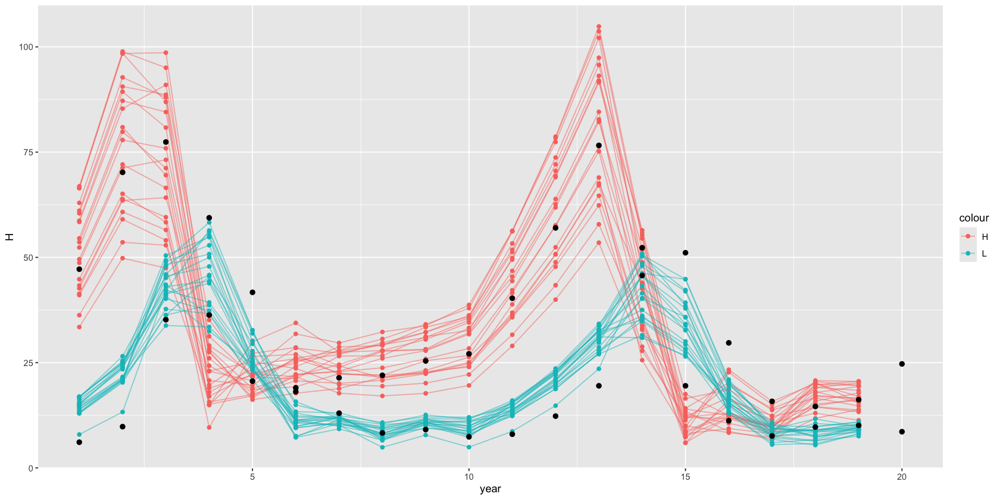

In [110]:
num_runs <- 20
plot_df <- data.frame(year = integer(), L = numeric(), H = numeric(), run = integer())
for (run in 1:num_runs) {
    run_df <- data.frame(L = means$mu_l[run, ], H = means$mu_h[run, ])
    run_df$year <- 1:nrow(run_df)
    run_df$run <- run
    plot_df <- rbind(plot_df, run_df)
}

original_data <- data.frame(
    L = Lynx_Hare$Lynx,
    H = Lynx_Hare$Hare
)
original_data$year <- 1:nrow(original_data)
lagged <- original_data
lagged$year <- lagged$year - 1
lagged <- lagged[-1, ]

ggplot(plot_df, aes(year, group = run)) +
    geom_point(aes(y = H, colour = "H")) +
    geom_line(aes(y = H, colour = "H"), alpha = 0.5) +
    geom_point(aes(y = L, colour = "L")) +
    geom_line(aes(y = L, colour = "L"), alpha = 0.5) +
    geom_point(data = lagged, mapping = aes(x = year, y = L), size = 2) +
    geom_point(data = lagged, mapping = aes(x = year, y = H), size = 2)

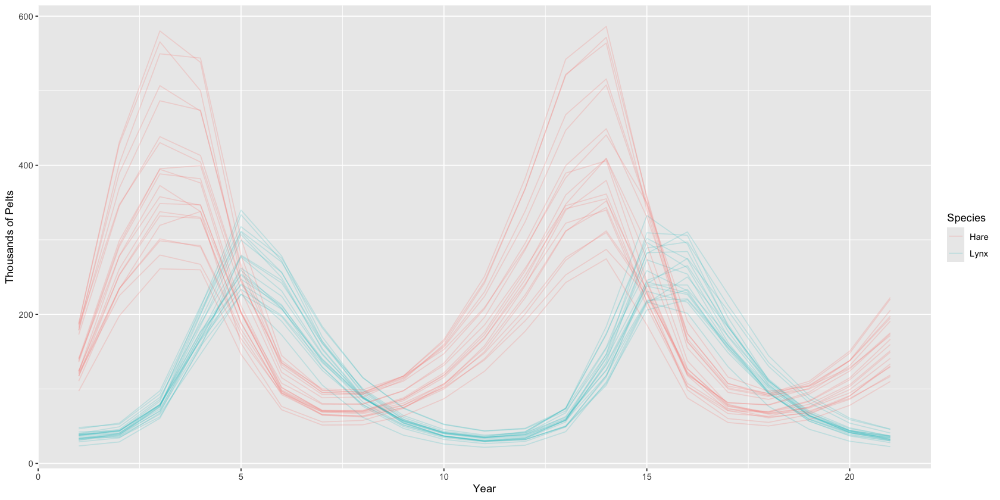

In [89]:
print(ode_plot)

These predictions actually seem to be fairly well matched; the difference is that the actual number of pelts is larger in the ODE model as compared to the autoregressive model.

**16H4** Adapt the autoregressive model to use a two-step lag. This means that $L_{t-2}$ and $H_{t-2}$, in addition to $L_{t-1}$ and $H_{t-1}$ will appear in the equation for $\mu$. This implies that prediction depends on not only what happened just before now, but also on what happened two time steps ago. How does this model perform, compared to the ODE model?

In [98]:
data(Lynx_Hare)
num_years <- length(Lynx_Hare$Lynx)
num_years
data_ar2 <- list(
    L = Lynx_Hare$Lynx[3:num_years],
    H = Lynx_Hare$Hare[3:num_years],
    L_lag1 = Lynx_Hare$Lynx[2:(num_years - 1)],
    H_lag1 = Lynx_Hare$Hare[2:(num_years - 1)],
    L_lag2 = Lynx_Hare$Lynx[1:(num_years - 2)],
    H_lag2 = Lynx_Hare$Hare[1:(num_years - 2)]
)

[1] 21

In [99]:
m16h4.1 <- ulam(
    alist(
        L ~ lognormal(log(mu_l), sigma_l),
        mu_l <- a_l + b_ll * L_lag1 + b_ll_lag2 * L_lag2 + b_lh * H_lag1 + b_lh_lag2 * H_lag2,
        H ~ lognormal(log(mu_h), sigma_h),
        mu_h <- a_h + b_hh * H_lag1 + b_hh_lag2 * H_lag2 + b_hl * L_lag1 + b_hl_lag2 * L_lag2,
        # priors
        a_l ~ normal(0, 1),
        a_h ~ normal(0, 1),
        sigma_l ~ exponential(1),
        sigma_h ~ exponential(1),
        b_ll ~ normal(0, 1),
        b_lh ~ normal(0, 1),
        b_hh ~ normal(0, 1),
        b_hl ~ normal(0, 1),
        b_ll_lag2 ~ normal(0, 1),
        b_lh_lag2 ~ normal(0, 1),
        b_hh_lag2 ~ normal(0, 1),
        b_hl_lag2 ~ normal(0, 1)
    ),
    data = data_ar2,
    chains = 4,
    cores = 4
)

Running MCMC with 4 parallel chains, with 1 thread(s) per chain...



Chain 1 Rejecting initial value:

Chain 1   Error evaluating the log probability at the initial value.

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b287db11b.stan', line 41, column 4 to column 41)

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b287db11b.stan', line 41, column 4 to column 41)



Chain 1 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 1 Iteration: 100 / 1000 [ 10%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b287db11b.stan', line 41, column 4 to column 41)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b287db11b.stan', line 41, column 4 to column 41)

Chain 1 If this warning occurs sporadically, such as for highly constraine

Chain 3 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 3 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 3 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 3 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 3 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 3 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 3 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 3 Iteration: 600 / 1000 [ 60%]  (Sampling) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b287db11b.stan', line 41, column 4 to column 41)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b287db11b.stan', line 41, column 4 to column 41)

Chain 3 If this warning occurs sporadically, such as for highly constraine

Chain 4 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 4 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 4 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 4 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 4 Iteration: 400 / 1000 [ 40%]  (Warmup) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b287db11b.stan', line 41, column 4 to column 41)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter[1] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b287db11b.stan', line 41, column 4 to column 41)

Chain 4 If this warning occurs sporadically, such as for highly constraine

Chain 1 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 1 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 1 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 1 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 1 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 1 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 1 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 1 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 1 Iteration: 900 / 1000 [ 90%]  (Sampling) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[15] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b287db11b.stan', line 41, column 4 to column 41)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter[4] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b287db11b.stan', line 41, column 4 to column 41)

Chain 1 If this warning occurs sporadically, such as for highly constrain

Chain 2 Iteration:   1 / 1000 [  0%]  (Warmup) 
Chain 2 Iteration: 100 / 1000 [ 10%]  (Warmup) 
Chain 2 Iteration: 200 / 1000 [ 20%]  (Warmup) 
Chain 2 Iteration: 300 / 1000 [ 30%]  (Warmup) 
Chain 2 Iteration: 400 / 1000 [ 40%]  (Warmup) 
Chain 2 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 2 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 2 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 2 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 2 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 2 Iteration: 900 / 1000 [ 90%]  (Sampling) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter[15] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b287db11b.stan', line 41, column 4 to column 41)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter[6] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b287db11b.stan', line 45, column 4 to column 41)

Chain 2 If this warning occurs sporadically, such as for highly constrain

Chain 3 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 3 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 3 Iteration: 900 / 1000 [ 90%]  (Sampling) 
Chain 3 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 4 Iteration: 500 / 1000 [ 50%]  (Warmup) 
Chain 4 Iteration: 501 / 1000 [ 50%]  (Sampling) 
Chain 4 Iteration: 600 / 1000 [ 60%]  (Sampling) 
Chain 4 Iteration: 700 / 1000 [ 70%]  (Sampling) 
Chain 4 Iteration: 800 / 1000 [ 80%]  (Sampling) 
Chain 4 Iteration: 900 / 1000 [ 90%]  (Sampling) 


Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter[18] is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/Rtmp3RKeBX/model-386b287db11b.stan', line 41, column 4 to column 41)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 



Chain 1 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 1 finished in 1.0 seconds.
Chain 2 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 2 finished in 0.7 seconds.
Chain 3 finished in 0.9 seconds.
Chain 4 Iteration: 1000 / 1000 [100%]  (Sampling) 
Chain 4 finished in 1.2 seconds.

All 4 chains finished successfully.
Mean chain execution time: 1.0 seconds.
Total execution time: 1.3 seconds.



See https://mc-stan.org/misc/warnings for details.




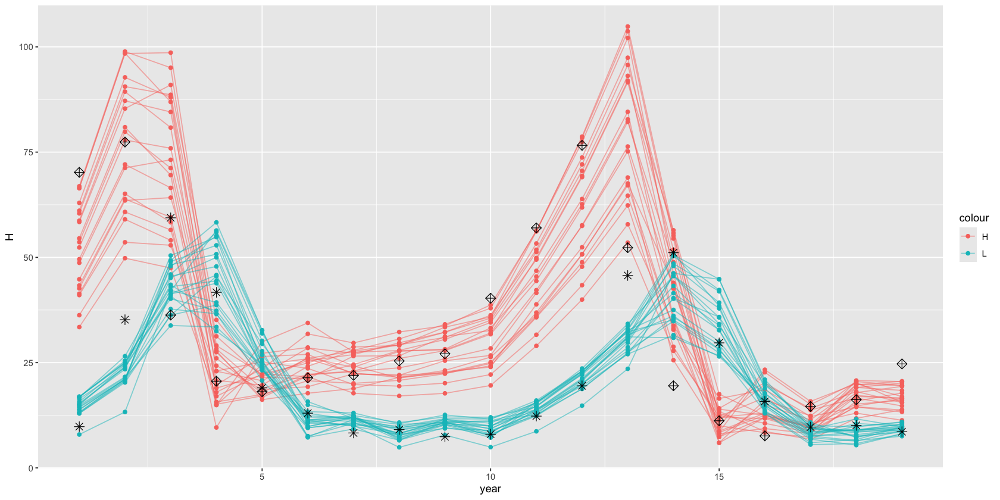

In [115]:
means <- link(m16h4.1)

num_runs <- 20
plot_df <- data.frame(year = integer(), L = numeric(), H = numeric(), run = integer())
for (run in 1:num_runs) {
    run_df <- data.frame(L = means$mu_l[run, ], H = means$mu_h[run, ])
    run_df$year <- 1:nrow(run_df)
    run_df$run <- run
    plot_df <- rbind(plot_df, run_df)
}

lagged <- original_data
lagged$year <- lagged$year - 2
lagged <- lagged[-c(1, 2), ]

ggplot(plot_df, aes(year, group = run)) +
    geom_point(aes(y = H, colour = "H")) +
    geom_line(aes(y = H, colour = "H"), alpha = 0.5) +
    geom_point(aes(y = L, colour = "L")) +
    geom_line(aes(y = L, colour = "L"), alpha = 0.5) +
    geom_point(data = lagged, mapping = aes(x = year, y = L), size = 3, shape = 8) +
    geom_point(data = lagged, mapping = aes(x = year, y = H), size = 3, shape = 9)

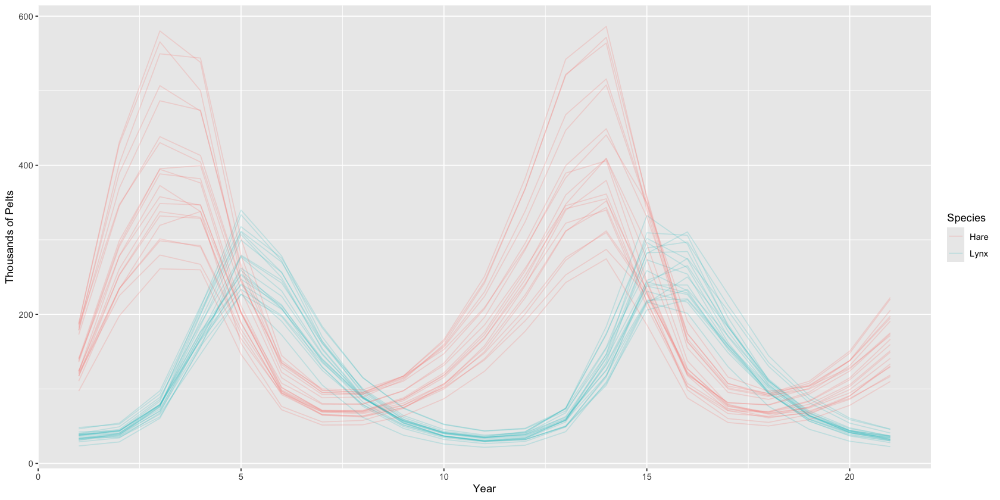

In [101]:
print(ode_plot)

Again, this is decent. It's obviously missing a lot of things that we built into our ealier models (propagation of error, &c.) and also doesn't have the explanatory power of the ODE model. It's also giving us basically the same prodictions as the one-step lag model, despite the added complexity.

**16H5** Population dynamics models are tyoically very difficult to fit to empirical data. The lynx-hare example in the chapter was easy, partly because the data are unusually simple and partly because chapter did the difficult prior selection for you. Here's another data set that will impress upon you both how hard the task can be and how badly Lotka-Volterra fits empirical data in general. The data in `data(Mites)` are numbers of predator and prey mites living on fruit. Model these data using the same Lotka-Volterra ODE system from the chapter. These data are actual counts of individuals, not just their pelts. You will need to adapt the [[Stan]] code in `data(Lynx_Hare_model)`. Note that the priors will need to be rescaled, because the outcome variables are on a different scale. Prior predictive simulation will help. Keep in mind as well that the time variable and the birth and death parameters go together. If you rescale the time dimension, that implies that you must rescale the parameters.

**Answer**

In [4]:
data(Mites)
d <- Mites
head(d)

,day,prey,predator
,<int>,<int>,<int>
1,16,194,75
2,23,896,119
3,29,1443,488
4,36,851,960
5,42,308,458
6,49,264,433


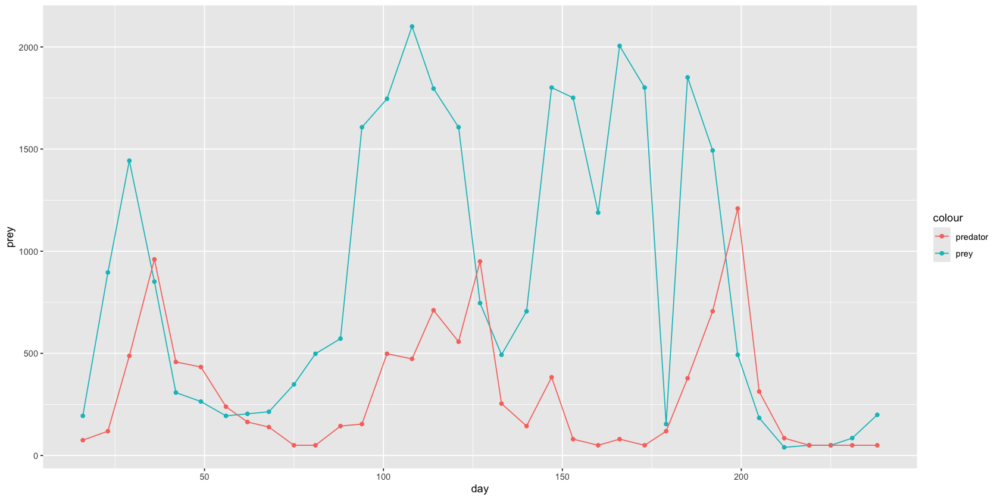

In [5]:
ggplot(d, aes(day)) +
    geom_point(aes(y = prey, colour = "prey")) +
    geom_point(aes(y = predator, colour = "predator")) +
    geom_line(aes(y = prey, colour = 'prey')) +
    geom_line(aes(y = predator, colour = 'predator'))

OK, so right away there are two things to consider. First, that doesn't have the cyclical look of a Lotka-Volterra system. Secondly, the time between the different observations is not consistent. I'm not sure whether that last point will be a problem, but something to keep in mind.

In [6]:
# predator <- P
# prey <- Y
# theta is b_y, m_y, b_p, m_p
sim_mites <- function(n_steps, init, theta, dt = 0.002) {
    P <- rep(NA, n_steps)
    Y <- rep(NA, n_steps)
    P[1] <- init[1]
    Y[1] <- init[2]

    b_y <- theta[1]
    m_y <- theta[2]
    b_p <- theta[3]
    m_p <- theta[4]
    for (i in 2:n_steps) {
        Y[i] <- Y[i - 1] + dt * Y[i - 1] * (b_y - m_y * P[i - 1])
        P[i] <- P[i - 1] + dt * P[i - 1] * (b_p * Y[i - 1] - m_p)
    }
    return(cbind(P, Y))
}

Let's try out some values for the parameters!

In [7]:
b_y <- 0.5
m_y <- 0.05
b_p <- 0.025
m_p <- 0.5
theta <- c(b_y, m_y, b_p, m_p)
step_dist = 0.002
num_steps <- (max(d$day) - min(d$day)) / step_dist
mites_sim <- sim_mites(num_steps, as.numeric(d[1, 2:3]), theta, dt = step_dist)
mites_df <- as.data.frame(mites_sim)
mites_df$time <- min(d$day) + step_dist * (1:nrow(mites_df) - 1)
head(mites_df)

,P,Y,time
,<dbl>,<dbl>,<dbl>
1,194.0000,75.00000,16.000
2,194.5335,73.62000,16.002
3,195.0550,72.26146,16.004
4,195.5647,70.92423,16.006
5,196.0627,69.60813,16.008
6,196.5490,68.31298,16.010


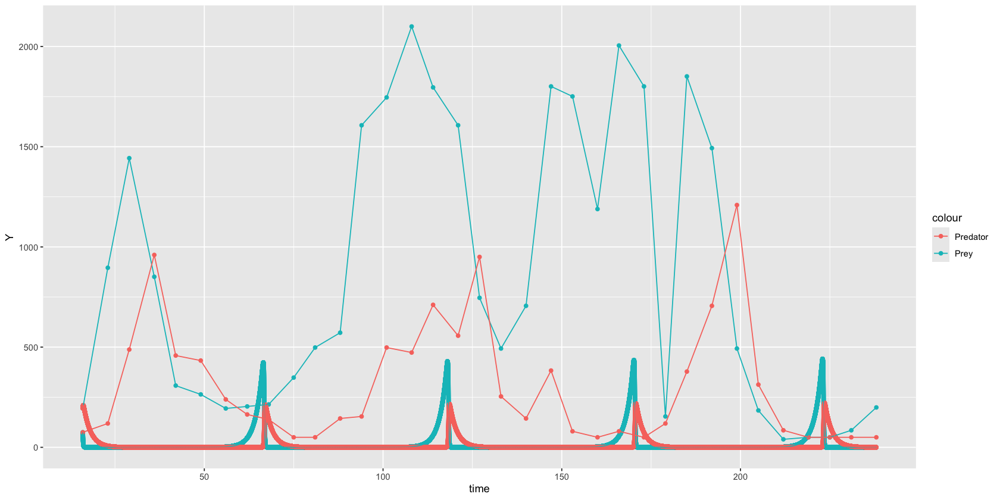

In [8]:
plot_df <- mites_df
plot_df$type = 'Simulated'
plot_df <- rbind(plot_df, data.frame(
    P = d$predator,
    Y = d$prey,
    time = d$day,
    type = "Measured"
))
ggplot(plot_df, aes(time, group = type)) +
    geom_point(aes(y = Y, colour = "Prey")) +
    geom_point(aes(y = P, colour = "Predator")) +
    geom_line(aes( y = Y, colour = "Prey" )) +
    geom_line(aes( y = P, colour = 'Predator' ))

OK, well there are a lot of things wrong here. Distance between peaks, initially decreasing vs. increasing populations, &c.

A few things to think about:
1. The parameters for the lynx / hare were for one year, whereas these ones are per day -> divide by 365
2. Seems to be more variability in the population sizes -> increase the values of the birth parameters?
3. Actual numbers need to be larger -> increase the birth parameters even more?

Let's test it out!

[1] 1.875e-01 6.250e-04 3.125e-05 3.125e-02


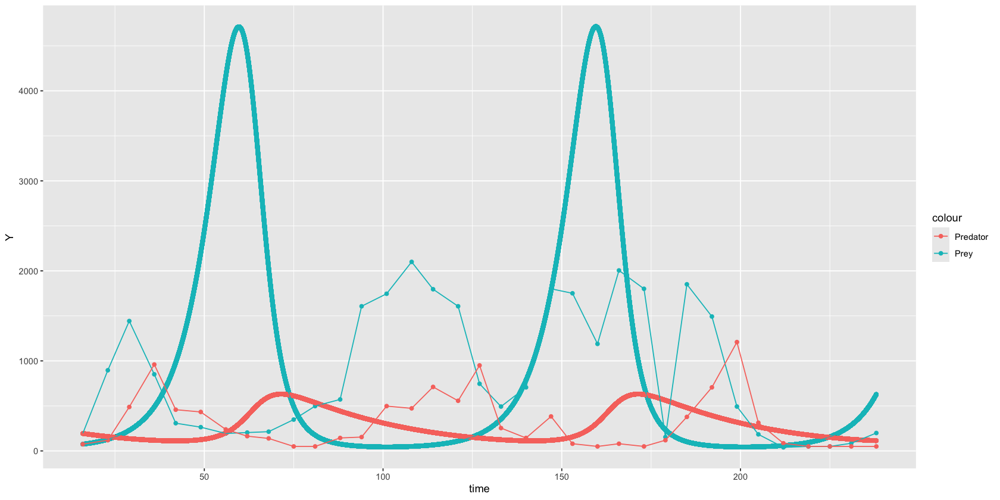

In [38]:
b_y <- 0.75
m_y <- 0.0025
b_p <- 0.000125
m_p <- 0.125
theta <- c(b_y, m_y, b_p, m_p)
theta <- theta / 4
step_dist = 0.002
num_steps <- (max(d$day) - min(d$day)) / step_dist
mites_sim <- sim_mites(num_steps, as.numeric(d[1, 2:3]), theta, dt = step_dist)
mites_df <- as.data.frame(mites_sim)
mites_df$time <- min(d$day) + step_dist * (1:nrow(mites_df) - 1)

plot_df <- mites_df
plot_df$type = 'Simulated'
plot_df <- rbind(plot_df, data.frame(
    P = d$predator,
    Y = d$prey,
    time = d$day,
    type = "Measured"
))
ggplot(plot_df, aes(time, group = type)) +
    geom_point(aes(y = Y, colour = "Prey")) +
    geom_point(aes(y = P, colour = "Predator")) +
    geom_line(aes( y = Y, colour = "Prey" )) +
    geom_line(aes( y = P, colour = 'Predator' ))
print(theta)

Oh my goodness. It was a real struggle to even get here. Compared to my earlier attempts, this at least has the advantage of having predators less than prey and a reasonable number of cycles. We'll go with this and hope that the data will do the rest of the work for us!

In [70]:
data_list <- list(
    N = nrow(d),
    mites = d[, 2:3]
)

stan_model_code <- "functions {
  array[] real dpop_dt( real t,                 // time
                array[] real pop_init,          // initial state {prey, predator}
                array[] real theta,             // parameters
                array[] real x_r, array[] int x_i) {  // unused
    real Y = pop_init[1];
    real P = pop_init[2];
    real by = theta[1];
    real my = theta[2];
    real mp = theta[3];
    real bp = theta[4];
    // differential equations
    real dY_dt = (by - my * P) * P;
    real dP_dt = (bp * Y - mp) * P;
    return { dY_dt , dP_dt };
  }
}
data {
  int<lower=0> N;              // number of measurement times
  array[N] vector<lower=0>[2] mites;    // measured populations
}
transformed data{
  array[N-1] int times_measured;    // N-1 because first time is initial state
  for ( i in 2:N ) times_measured[i-1] = i;
}
parameters {
  array[4] real<lower=0> theta;      // { by, my, mp, bp }
  array[2] real<lower=0> pop_init;   // initial population state
  array[2] real<lower=0> sigma;      // measurement errors
}
transformed parameters {
  array[N, 2] real pop;
  pop[1,1] = pop_init[1];
  pop[1,2] = pop_init[2];
  pop[2:N,1:2] = integrate_ode_rk45(
    dpop_dt, pop_init, 0, times_measured, theta,
    rep_array(0.0, 0), rep_array(0, 0),
    1e-5, 1e-3, 5e2);
}
model {
  // priors
  theta[1] ~ normal(1.875e-1, 1e-2);
  theta[2] ~ normal(6.25e-4, 6e-5);
  theta[3] ~ normal(3.125e-5, 3e-6);
  theta[4] ~ normal(3.125e-2, 3e-3);
  sigma ~ exponential( 1 );
  pop_init ~ lognormal( log(10) , 1 );
  // observation model
  // connect latent population state to observed pelts
  for ( t in 1:N )
    for ( k in 1:2 )
      mites[t,k] ~ lognormal( log(pop[t,k]) , sigma[k] );
}
generated quantities {
  array[N] vector[2] mites_pred;
  for ( t in 1:N )
    for ( k in 1:2 )
      mites_pred[t,k] = lognormal_rng( log(pop[t,k]) , sigma[k] );
}"

stan_file <- write_stan_file(stan_model_code)
stan_model <- cmdstan_model(stan_file)
fit <- stan_model$sample(
    data = data_list,
    chains = 4,
    parallel_chains = 4
)

Warning in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 35, column 17: integrate_ode_rk45
    is deprecated and will be removed in Stan 3.0. Use ode_rk45 instead. 
    The new interface is slightly different, see:
    https://mc-stan.org/users/documentation/case-studies/convert_odes.html




Running MCMC with 4 parallel chains...



Chain 1 Rejecting initial value:

Chain 1   Error evaluating the log probability at the initial value.

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 Rejecting initial value:

Chain 1   Error evaluating the log probability at the initial value.

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', l

Chain 1 Iteration:    1 / 2000 [  0%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: integrate_ode_rk45:  Failed to integrate to next output time (5) in less than max_num_steps steps (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 35, column 2 to line 38, column 21)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: integrate_ode_rk45:  Failed to integrate to next output time (3) in less than max_num_steps steps (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 35, column 2 to line 38, colu

Chain 2 Iteration:    1 / 2000 [  0%]  (Warmup) 


Chain 2 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: integrate_ode_rk45: initial state[2] is inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 35, column 2 to line 38, column 21)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then

Chain 3 Iteration:    1 / 2000 [  0%]  (Warmup) 


Chain 3 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model

Chain 4 Iteration:    1 / 2000 [  0%]  (Warmup) 


Chain 4 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter is -inf, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your mode

Chain 2 Iteration:  100 / 2000 [  5%]  (Warmup) 
Chain 2 Iteration:  200 / 2000 [ 10%]  (Warmup) 
Chain 2 Iteration:  300 / 2000 [ 15%]  (Warmup) 


Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a330250

Chain 4 Iteration:  100 / 2000 [  5%]  (Warmup) 
Chain 4 Iteration:  200 / 2000 [ 10%]  (Warmup) 
Chain 4 Iteration:  300 / 2000 [ 15%]  (Warmup) 
Chain 4 Iteration:  400 / 2000 [ 20%]  (Warmup) 
Chain 4 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 4 Iteration:  600 / 2000 [ 30%]  (Warmup) 


Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a330250

Chain 1 Iteration:  100 / 2000 [  5%]  (Warmup) 


Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception:

Chain 2 Iteration:  400 / 2000 [ 20%]  (Warmup) 
Chain 2 Iteration:  500 / 2000 [ 25%]  (Warmup) 


Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 2 If this warning occurs sporadically, such as for highly constrained vari

Chain 3 Iteration:  100 / 2000 [  5%]  (Warmup) 
Chain 3 Iteration:  200 / 2000 [ 10%]  (Warmup) 


Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception:

Chain 4 Iteration:  700 / 2000 [ 35%]  (Warmup) 
Chain 4 Iteration:  800 / 2000 [ 40%]  (Warmup) 
Chain 4 Iteration:  900 / 2000 [ 45%]  (Warmup) 
Chain 4 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 4 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 4 Iteration: 1100 / 2000 [ 55%]  (Sampling) 


Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 4 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 4 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 4 

Chain 4 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 4 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 4 If this warning occurs sporadically, such as for highly constrained vari

Chain 1 Iteration:  200 / 2000 [ 10%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 2 Iteration:  600 / 2000 [ 30%]  (Warmup) 
Chain 3 Iteration:  300 / 2000 [ 15%]  (Warmup) 
Chain 3 Iteration:  400 / 2000 [ 20%]  (Warmup) 


Chain 3 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model

Chain 4 Iteration: 1200 / 2000 [ 60%]  (Sampling) 
Chain 4 Iteration: 1300 / 2000 [ 65%]  (Sampling) 
Chain 4 Iteration: 1400 / 2000 [ 70%]  (Sampling) 


Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model

Chain 2 Iteration:  700 / 2000 [ 35%]  (Warmup) 
Chain 2 Iteration:  800 / 2000 [ 40%]  (Warmup) 
Chain 3 Iteration:  500 / 2000 [ 25%]  (Warmup) 
Chain 3 Iteration:  600 / 2000 [ 30%]  (Warmup) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 3 If this warning occurs sporadically, such as for highly constrained vari

Chain 4 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 4 Iteration: 1600 / 2000 [ 80%]  (Sampling) 
Chain 4 Iteration: 1700 / 2000 [ 85%]  (Sampling) 
Chain 4 Iteration: 1800 / 2000 [ 90%]  (Sampling) 
Chain 1 Iteration:  300 / 2000 [ 15%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 2 Iteration:  900 / 2000 [ 45%]  (Warmup) 
Chain 2 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 2 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 2 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 2 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 2 

Chain 2 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 2 Exception: lognormal_lpdf: Location parameter is nan, but must be finite!

Chain 3 Iteration:  700 / 2000 [ 35%]  (Warmup) 
Chain 3 Iteration:  800 / 2000 [ 40%]  (Warmup) 
Chain 3 Iteration:  900 / 2000 [ 45%]  (Warmup) 


Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a330250

Chain 4 Iteration: 1900 / 2000 [ 95%]  (Sampling) 
Chain 4 Iteration: 2000 / 2000 [100%]  (Sampling) 
Chain 4 finished in 3.4 seconds.


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 3 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 3 Iteration: 1001 / 2000 [ 50%]  (Sampling) 
Chain 3 Iteration: 1100 / 2000 [ 55%]  (Sampling) 
Chain 3 Iteration: 1200 / 2000 [ 60%]  (Sampling) 


Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception:

Chain 1 Iteration:  400 / 2000 [ 20%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Iteration: 1100 / 2000 [ 55%]  (Sampling) 
Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 3 Iteration: 1300 / 2000 [ 65%]  (Sampling) 
Chain 3 Iteration: 1400 / 2000 [ 70%]  (Sampling) 
Chain 3 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 3 Iteration: 1600 / 2000 [ 80%]  (Sampling) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a330250

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 3 Iteration: 1700 / 2000 [ 85%]  (Sampling) 
Chain 1 Iteration:  500 / 2000 [ 25%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 3 Iteration: 1800 / 2000 [ 90%]  (Sampling) 
Chain 3 Iteration: 1900 / 2000 [ 95%]  (Sampling) 
Chain 3 Iteration: 2000 / 2000 [100%]  (Sampling) 


Chain 3 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 3 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 3 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 3 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 3 



Chain 3 finished in 5.9 seconds.


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Iteration: 1200 / 2000 [ 60%]  (Sampling) 
Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 1 Iteration:  600 / 2000 [ 30%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Iteration: 1300 / 2000 [ 65%]  (Sampling) 
Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite!

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 1 Iteration:  700 / 2000 [ 35%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite!

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Iteration: 1400 / 2000 [ 70%]  (Sampling) 
Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 1 Iteration:  800 / 2000 [ 40%]  (Warmup) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite!

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Iteration: 1500 / 2000 [ 75%]  (Sampling) 
Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 1 Iteration:  900 / 2000 [ 45%]  (Warmup) 


Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception:

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Iteration: 1600 / 2000 [ 80%]  (Sampling) 
Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 1 Iteration: 1000 / 2000 [ 50%]  (Warmup) 
Chain 1 Iteration: 1001 / 2000 [ 50%]  (Sampling) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite!

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite!

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Iteration: 1700 / 2000 [ 85%]  (Sampling) 
Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 1 Iteration: 1100 / 2000 [ 55%]  (Sampling) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 1 Iteration: 1200 / 2000 [ 60%]  (Sampling) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Iteration: 1800 / 2000 [ 90%]  (Sampling) 
Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite!

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 1 Iteration: 1300 / 2000 [ 65%]  (Sampling) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Iteration: 1900 / 2000 [ 95%]  (Sampling) 
Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite!

Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 Iteration: 2000 / 2000 [100%]  (Sampling) 


Chain 2 Exception: lognormal_rng: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 58, column 6 to column 66)



Chain 2 finished in 12.7 seconds.
Chain 1 Iteration: 1400 / 2000 [ 70%]  (Sampling) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 1 Iteration: 1500 / 2000 [ 75%]  (Sampling) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 1 Iteration: 1600 / 2000 [ 80%]  (Sampling) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 1 Iteration: 1700 / 2000 [ 85%]  (Sampling) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 1 Iteration: 1800 / 2000 [ 90%]  (Sampling) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 1 Iteration: 1900 / 2000 [ 95%]  (Sampling) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 1 Iteration: 2000 / 2000 [100%]  (Sampling) 


Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

Chain 1 but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Chain 1 

Chain 1 Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Chain 1 Exception: lognormal_lpdf: Location parameter is nan, but must be finite! (in '/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T/RtmpU6GHTu/model-25a3302503e6.stan', line 52, column 6 to column 57)

Chain 1 If this warning occurs sporadically, such as for highly constrained vari

Chain 1 finished in 16.2 seconds.

All 4 chains finished successfully.
Mean chain execution time: 9.5 seconds.
Total execution time: 16.4 seconds.



See https://mc-stan.org/misc/warnings for details.


See https://mc-stan.org/misc/warnings for details.


See https://mc-stan.org/misc/warnings for details.




In [71]:
post <- as_draws_df(fit)
head(post)

Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”


lp__,theta[1],theta[2],theta[3],theta[4],pop_init[1],pop_init[2],sigma[1],sigma[2],"pop[1,1]",⋯,"mites_pred[29,2]","mites_pred[30,2]","mites_pred[31,2]","mites_pred[32,2]","mites_pred[33,2]","mites_pred[34,2]","mites_pred[35,2]",.chain,.iteration,.draw
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>
-6715800000,5.44498,4.62777,0.259561,0.324376,0.587872,0.972221,3.98348,1.08378,0.587872,⋯,1.006760,1.727490,1.035010,2.615350,6.40105,1.815060,1.348430,1,1,1
-6715800000,5.44498,4.62777,0.259561,0.324376,0.587872,0.972221,3.98348,1.08378,0.587872,⋯,0.525466,0.910842,0.507829,0.596238,1.19459,1.386460,0.995008,1,2,2
-6715800000,5.44498,4.62777,0.259561,0.324376,0.587872,0.972221,3.98348,1.08378,0.587872,⋯,2.752130,1.783120,0.934811,2.361340,3.43183,0.623215,1.008860,1,3,3
-6715790000,5.44498,4.62777,0.259561,0.324376,0.587872,0.972221,3.98348,1.08378,0.587872,⋯,0.870138,2.255180,2.610850,1.386340,5.37742,6.063010,1.058080,1,4,4
-6715790000,5.44498,4.62777,0.259561,0.324376,0.587872,0.972221,3.98348,1.08378,0.587872,⋯,0.783899,0.604305,1.804560,0.981010,0.66496,0.150471,0.614556,1,5,5
-6715790000,5.44498,4.62777,0.259561,0.324376,0.587872,0.972221,3.98348,1.08378,0.587872,⋯,3.548470,7.417050,0.154573,0.153791,2.21868,2.643170,0.855338,1,6,6


Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as required metadata was removed.”
Warning message:
“Dropping 'draws_df' class as requi

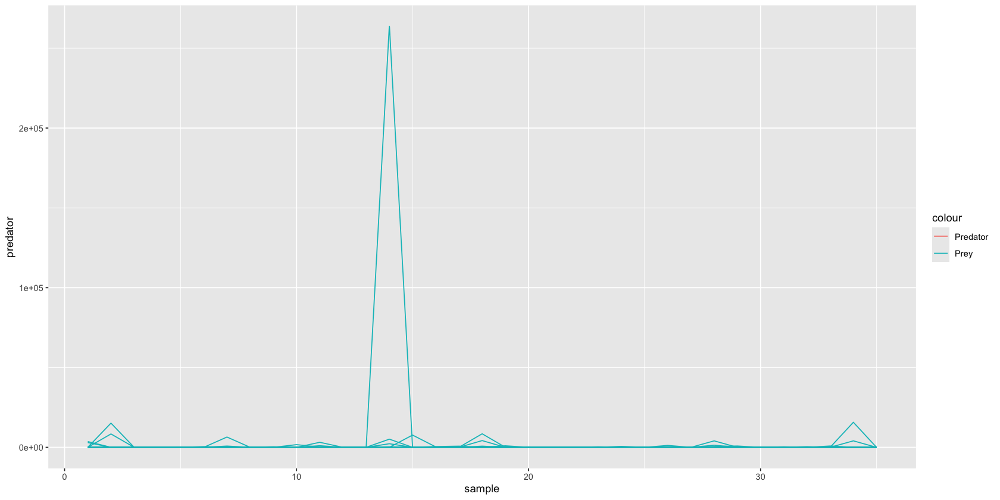

In [72]:
plot_df <- data.frame(predator = d$predator, prey = d$prey, run = 0, type = "Data", sample = 1:nrow(d))
for (run in 1:20) {
    predator <- post[run,grep('mites_pred\\[[0-9]+,2\\]', colnames(post), perl = TRUE)]
    predator <- as.numeric(predator)
    prey <- post[run,grep('mites_pred\\[[0-9]+,1\\]', colnames(post), perl = TRUE)]
    prey <- as.numeric(prey)
    run_df <- data.frame(predator = predator, prey = prey, run = run, type = "Simulated", sample = 1:length(predator))
    # print(run_df)
    plot_df <- rbind(plot_df, run_df)
}

ggplot(plot_df[plot_df$type != 'Data', ], aes(sample, group = run)) +
    geom_line(aes(y = predator, colour = "Predator")) +
    geom_line(aes(y = prey, colour = "Prey"))


Well, that's a disappointing end. This was obviously not fitting correctly.